# Milestone 3 - Data story (report)

To see only what has been done from the end of milestone 2, click on "Milestone 3" in the Table of Content.

---

## Imports

In [139]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import pickle
import re
import nltk
import geopandas

from shapely.geometry import Polygon

import folium
import json

## Table of content

[MILESTONE 2](#milestone2)
-
[1. Loading](#Loading)<br>

[2. Data exploration and cleaning](#cleaning) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[2.A Raw Crops](#cleaning-crops) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[2.B Raw Trades](#cleaning-trades) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[2.C Raw Trades 2017](#cleaning-trades-2017) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[2.D Missing Values](#cleaning-missing-values) <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Crops](#cleaning-missing-values-crops) <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Trades](#cleaning-missing-values-trades) <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Trades 2017](#cleaning-missing-values-trades-2017) <br>

[3. Merge Dataframes](#merge) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[3.A Trades and Trades 2017](#merge-trades) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[3.B Item Labelling](#merge-items) <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Introduction to the problem](#merge-items-intro) <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Try first word as key word](#extraction1) <br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[Implementation with stemmer and fixes](#extraction2) <br>

[4. Group by countries](#group-countries) <br>

[5. Group by crops](#group-crops) <br>

[6. Import-export Dataframe](#import) <br>

[7. Plots](#plots) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[7.A First Example : Biggest importers and exporters](#plots1) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[7.B Second Example : Net Exported quantity and profit in Europe](#plots2) <br>
&nbsp;&nbsp;&nbsp;&nbsp;[7.C Third Example : Most Exported Crop in Africa](#plots4) <br>

[8. Conclusion and next steps](#ccl) <br>

[9. Teaser](#teaser) <br>

[MILESTONE 3](#milestone3)
-
[0. Reload](#starting)<br>

[1. Final dataframe construction process](#df_construction)<br>

[2. Visualisation tools](#visualisation)<br>

[3. The items of our data story](#our_items)<br>

[4. Global Analysis](#general)<br>

[5. Wheat's story](#wheat) <br>

[6. Avocado's story](#avocado) <br>

[7. Coffee's story](#coffee)<br>

[8. Tobacco's story](#tobacco)<br>

---

<a id='milestone2'></a>
## MILESTONE 2

<a id='Loading'></a>
## 1. Loading

Reference of dataset : http://www.fao.org/faostat/en/#data

We choose to work with three tables : 
- Crops (from production) [download here](http://fenixservices.fao.org/faostat/static/bulkdownloads/Production_Crops_E_All_Data_(Normalized).zip)
- Crops and livestock products (from trades) for all years normalized [download here](http://fenixservices.fao.org/faostat/static/bulkdownloads/Trade_Crops_Livestock_E_All_Data_(Normalized).zip) 
- Crops and livestock products (from trades) for the year 2017 normalized

**Description of the datasets :**

The Crops dataframe contains all the crops and groups of crops produced for each country during a period between 1961 and 2017. For each country, each year and a specific crop, we can see three different type of values : 
   - The production [tonnes]
   - The yield [hg/ha]
   - The surface area [ha]

Each Item (a crop basically) has an associated ID and the same for every countries. The file has also a `Flag` column which describes the origin of the data. 

Different types of `Flag` : 
- 'M' : Missing 
- 'A' : Aggregate, may include official, semi-official, estimated or calculated data
- 'F' : FAO estimate
- 'Im' : FAO data based on imputation methodology - 
- 'Fc' : Calculated data

Regarding the `Flag`, the data may also come from an official source and the field is left empty in the .csv file so when it is uploaded with pandas those will `np.nan`

The second file focuses on the trading of Crops but also livestocks products. The file is downloaded on the same website. We have the following element (type of data) for each item (crops or products) for each country and each year : 
   - The import value [1000 \$]
   - The import quantity [tonnes]
   - The export value [1000 \$]
   - The export quantity [tonnes]
   
  
We included the last file from the FAOSTAT because when we downloaded the file "Crops and livestock products" the last year with records was the year 2016. So, to be consistent with the crops production file which stop in 2017 we decided to add this year as well in the trades

In [6]:
raw_crops = pd.read_csv('data/crops_production.csv',encoding = "ISO-8859-1")
raw_trade = pd.read_csv('data/crops_trades.csv',encoding = "ISO-8859-1")
raw_trade_2017 = pd.read_csv('data/crops_trades_2017.csv')

For consistency, we put all columns titles to lower case and use underscores. We will stick to this for the whole notebook.

In [7]:
raw_crops.columns = map(lambda name : name.lower().replace(' ', '_'), raw_crops.columns) #Column names to lower case
raw_trade.columns = map(lambda name : name.lower().replace(' ', '_'), raw_trade.columns) #Column names to lower case
raw_trade_2017.columns = map(lambda name : name.lower().replace(' ', '_'), raw_trade_2017.columns) #Column names to lower case

In [8]:
print(raw_crops.shape)
raw_crops.head()

(2425275, 11)


,area_code,area,item_code,item,element_code,element,year_code,year,unit,value,flag
0,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1975,1975,ha,0.0,F
1,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1976,1976,ha,5900.0,F
2,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1977,1977,ha,6000.0,F
3,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1978,1978,ha,6000.0,F
4,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1979,1979,ha,6000.0,F


In [9]:
print(raw_trade.shape)
raw_trade.head()

(15386177, 11)


,area_code,area,item_code,item,element_code,element,year_code,year,unit,value,flag
0,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2014,2014,tonnes,167.0,R
1,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2015,2015,tonnes,181.0,R
2,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2016,2016,tonnes,845.0,R
3,2,Afghanistan,231,Almonds shelled,5622,Import Value,2014,2014,1000 US$,1116.0,R
4,2,Afghanistan,231,Almonds shelled,5622,Import Value,2015,2015,1000 US$,1377.0,R


In [10]:
print(raw_trade_2017.shape)
raw_trade_2017.head()

(175158, 14)


,domain_code,domain,area_code,area,element_code,element,item_code,item,year_code,year,unit,value,flag,flag_description
0,TP,Crops and livestock products,2,Afghanistan,5610,Import Quantity,231,Almonds shelled,2017,2017,tonnes,102.0,R,Estimated data using trading partners database
1,TP,Crops and livestock products,2,Afghanistan,5622,Import Value,231,Almonds shelled,2017,2017,1000 US$,758.0,R,Estimated data using trading partners database
2,TP,Crops and livestock products,2,Afghanistan,5910,Export Quantity,231,Almonds shelled,2017,2017,tonnes,3335.0,NaN,Official data
3,TP,Crops and livestock products,2,Afghanistan,5922,Export Value,231,Almonds shelled,2017,2017,1000 US$,23248.0,NaN,Official data
4,TP,Crops and livestock products,2,Afghanistan,5610,Import Quantity,221,"Almonds, with shell",2017,2017,tonnes,41.0,R,Estimated data using trading partners database


<a id='cleaning'></a>
## 2. Data exploration and cleaning

<a id='cleaning-crops'></a>
### 2.A. Raw Crops

In [11]:
raw_crops.dtypes

area_code         int64
area             object
item_code         int64
item             object
element_code      int64
element          object
year_code         int64
year              int64
unit             object
value           float64
flag             object
dtype: object

Number of Areas :

In [12]:
raw_crops.area.nunique()

258

Numer of Items :

In [13]:
raw_crops.item.nunique()

180

<a id='cleaning-trades'></a>
### 2.B. Raw Trades

In [14]:
raw_trade.dtypes

area_code         int64
area             object
item_code         int64
item             object
element_code      int64
element          object
year_code         int64
year              int64
unit             object
value           float64
flag             object
dtype: object

Number of Areas :

In [15]:
raw_trade.area.nunique()

253

Number of Items :

In [16]:
raw_trade.item.nunique()

471

<a id='cleaning-trades-2017'></a>
### 2.C. Raw Trades 2017

In [17]:
raw_trade_2017.dtypes

domain_code          object
domain               object
area_code             int64
area                 object
element_code          int64
element              object
item_code             int64
item                 object
year_code             int64
year                  int64
unit                 object
value               float64
flag                 object
flag_description     object
dtype: object

Number of Areas :

In [18]:
raw_trade_2017.area.nunique()

206

Numer of Items :

In [19]:
raw_trade_2017.item.nunique()

372

**Conclusions:**

- We notice that the number of `Areas` for the `crops` is the biggest where as its smaller for the `trades`

- Because all the official data will contains `np.nan`, we will first remove the values with the flag M which corresponds to Missing values 

<a id='cleaning-missing-values'></a>
### 2.D Missing values

In [20]:
cleaned_crops = raw_crops[raw_crops.flag !='M'].drop(['year_code'],axis=1)

In [21]:
cleaned_trade = raw_trade[raw_trade.flag !='M'].drop(['year_code'],axis=1)

In [22]:
cleaned_trade_2017 = raw_trade_2017[raw_trade_2017.flag !='M'].drop(['year_code','flag_description'],axis=1)

<a id='cleaning-missing-values-crops'></a>

Let's look at the null values for each dataframe :

**Crops**

In [23]:
# Where are the Nan values from :
cleaned_crops.isnull().sum()

area_code            0
area                 0
item_code            0
item                 0
element_code         0
element              0
year                 0
unit                 0
value            28712
flag            512959
dtype: int64

For the crops Dataframe there's a quite significant number of entries that are null is Value and in Flag. For the Flag, the entries correespond to official data where the flag is empty in the original dataset and Nan value in the dataset. For the Values, we suspect that they correspond to entries (products) that were not produced during this year, we'll go into more details to see if we can delete those rows or if we set the replace the value by 0.

In [24]:
df_crops_null = cleaned_crops[cleaned_crops.value.isnull()]

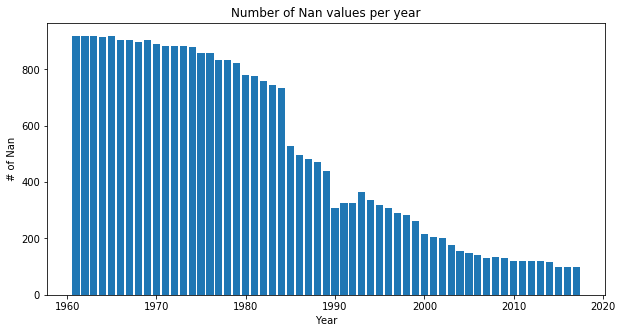

In [25]:
fig,ax=plt.subplots(figsize=(10,5))
plt.bar(pd.DataFrame(df_crops_null.year.value_counts()).sort_index().index.values, 
        pd.DataFrame(df_crops_null.year.value_counts()).sort_index().iloc[:,0].values)
plt.xlabel('Year'),plt.ylabel('# of Nan'), plt.title('Number of Nan values per year')
plt.show()

In [26]:
df_crops_null.groupby(['area','item']).agg(['min','max','count']).year

min   max  count
area         item                                 
Africa       Areca nuts          1961  1985     25
             Blueberries         1961  1988     28
             Cassava leaves      1961  1989     58
             Chestnut            1961  1984     48
             Coir                1961  1989     29
...                               ...   ...    ...
World        Tallowtree seed     1961  1984     24
             Triticale           1961  1974     28
Yugoslav SFR Citrus Fruit,Total  1961  1984     24
             Treenuts,Total      1961  1984     24
Zimbabwe     Treenuts,Total      1961  1978     36

[735 rows x 3 columns]

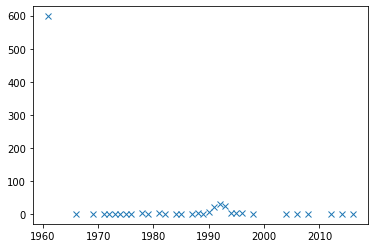

In [27]:
plt.plot(df_crops_null.groupby(['area','item']).agg(['min','max','count']).year['min'].value_counts(),'x')

<a id='cleaning-missing-values-trades'></a>

**Trades**

In [28]:
# Where are the Nan values from :
df_trade_null = cleaned_trade[cleaned_trade.value.isnull()]
df_trade_null.shape

(414679, 10)

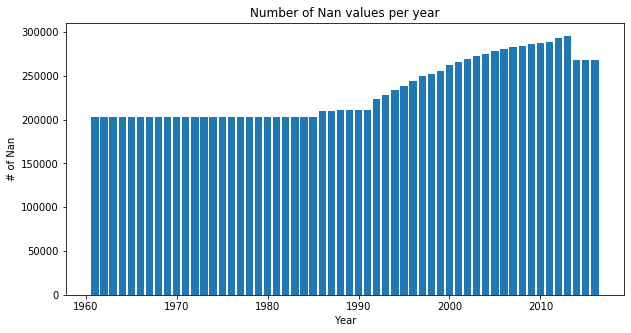

In [29]:
fig,ax=plt.subplots(figsize=(10,5))
plt.bar(pd.DataFrame(cleaned_trade.year.value_counts()).sort_index().index.values, 
        pd.DataFrame(cleaned_trade.year.value_counts()).sort_index().iloc[:,0].values)
plt.xlabel('Year'),plt.ylabel('# of Nan'), plt.title('Number of Nan values per year')
plt.show()

In [30]:
df_trade_null.groupby(['area','item']).agg(['min','max','count']).year

min   max  count
area        item                                       
Afghanistan Cereals                   1961  2008     96
            Cereals and Preparations  1961  2008     48
            Dairy Products+Eggs       1961  2008     48
            Fodder & Feeding stuff    1961  2008     96
            Meat Sheep Fresh          1961  2010    100
...                                    ...   ...    ...
Zimbabwe    Cassava Equivalent        1961  1993     66
            Crude Materials nes       1961  2003     86
            Eggs Liquid,Dried         1961  1994     34
            Flax Fib+Tow+W            1961  1993     67
            Silk                      1961  1996    104

[5949 rows x 3 columns]

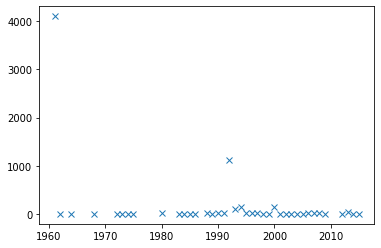

In [31]:
plt.plot(df_trade_null.groupby(['area','item']).agg(['min','max','count']).year['min'].value_counts(),'x')

In [32]:
df_trade_groupby_area_item = df_trade_null.groupby(['area','item']).agg(['min','max','count']).year
df_trade_groupby_area_item.head()

min   max  count
area        item                                       
Afghanistan Cereals                   1961  2008     96
            Cereals and Preparations  1961  2008     48
            Dairy Products+Eggs       1961  2008     48
            Fodder & Feeding stuff    1961  2008     96
            Meat Sheep Fresh          1961  2010    100

In [33]:
df_trade_groupby_area_item['min'].value_counts().head()

1961    4102
1992    1117
1994     151
2000     143
1993     109
Name: min, dtype: int64

In [34]:
df_trade_groupby_area_item[df_trade_groupby_area_item['min']==1992].index.get_level_values('area').unique()

Index(['Armenia', 'Asia', 'Azerbaijan', 'Belarus', 'Bosnia and Herzegovina',
       'Central Asia', 'China', 'Croatia', 'Eastern Asia', 'Eastern Europe',
       'Estonia', 'Europe', 'European Union', 'Georgia', 'Kazakhstan',
       'Kyrgyzstan', 'Land Locked Developing Countries', 'Latvia', 'Lithuania',
       'Low Income Food Deficit Countries', 'Melanesia', 'Northern Europe',
       'Republic of Moldova', 'Romania', 'Russian Federation',
       'Saint Vincent and the Grenadines', 'Serbia and Montenegro', 'Slovenia',
       'Southern Europe', 'Tajikistan',
       'The former Yugoslav Republic of Macedonia', 'Turkmenistan', 'Ukraine',
       'Uzbekistan', 'Western Asia', 'World'],
      dtype='object', name='area')

<a id='cleaning-missing-values-trades-2017'></a>

**Trades 2017**

In [35]:
cleaned_trade_2017.isnull().sum()

domain_code          0
domain               0
area_code            0
area                 0
element_code         0
element              0
item_code            0
item                 0
year                 0
unit                 0
value                0
flag            123608
dtype: int64

**Conclusion**

We can remove nan values. Because incomplete are for dummies, because we only want complete entries of each type 

In [36]:
cleaned_crops = cleaned_crops[~cleaned_crops.drop(['flag'],axis=1).isnull()]

In [37]:
cleaned_crops.head()

,area_code,area,item_code,item,element_code,element,year,unit,value,flag
0,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1975,ha,0.0,NaN
1,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1976,ha,5900.0,NaN
2,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1977,ha,6000.0,NaN
3,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1978,ha,6000.0,NaN
4,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1979,ha,6000.0,NaN


In [38]:
cleaned_trade = cleaned_trade[~cleaned_trade.drop(['flag'],axis=1).isnull()]

In [39]:
cleaned_trade.head()

,area_code,area,item_code,item,element_code,element,year,unit,value,flag
0,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2014,tonnes,167.0,NaN
1,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2015,tonnes,181.0,NaN
2,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2016,tonnes,845.0,NaN
3,2,Afghanistan,231,Almonds shelled,5622,Import Value,2014,1000 US$,1116.0,NaN
4,2,Afghanistan,231,Almonds shelled,5622,Import Value,2015,1000 US$,1377.0,NaN


In [40]:
cleaned_trade_2017 = cleaned_trade_2017[~cleaned_trade_2017.drop(['flag'],axis=1).isnull()]

In [41]:
cleaned_trade_2017.head()

,domain_code,domain,area_code,area,element_code,element,item_code,item,year,unit,value,flag
0,TP,Crops and livestock products,2,Afghanistan,5610,Import Quantity,231,Almonds shelled,2017,tonnes,102.0,NaN
1,TP,Crops and livestock products,2,Afghanistan,5622,Import Value,231,Almonds shelled,2017,1000 US$,758.0,NaN
2,TP,Crops and livestock products,2,Afghanistan,5910,Export Quantity,231,Almonds shelled,2017,tonnes,3335.0,NaN
3,TP,Crops and livestock products,2,Afghanistan,5922,Export Value,231,Almonds shelled,2017,1000 US$,23248.0,NaN
4,TP,Crops and livestock products,2,Afghanistan,5610,Import Quantity,221,"Almonds, with shell",2017,tonnes,41.0,NaN


<a id='merge'></a>

## 3. Merge Dataframes

<a id='merge-trades'></a>

### 3.A. Trades and Trades 2017

We will keep only Item codes and Items which are represented in both dataframe. (the rest will not be useful to us) Indeed, if we have only one prodcut that appears in 2017 and not before it does not make sense to analyse it and the same if we have one product up to 2016 but not in 2017 it doesn't make sense to analyse it.

In [42]:
raw_trade_filtered = cleaned_trade.loc[(cleaned_trade['item'].isin(cleaned_trade_2017.item.unique())) 
                                   & (cleaned_trade['item_code'].isin(cleaned_trade_2017.item_code.unique()))]

In [43]:
raw_trade_2017_filtered = cleaned_trade_2017.loc[(cleaned_trade_2017['item'].isin(cleaned_trade.item.unique())) 
                                   & (cleaned_trade_2017['item_code'].isin(cleaned_trade.item_code.unique()))]

In [44]:
trades_df = pd.concat([raw_trade_filtered,raw_trade_2017_filtered],axis=0,ignore_index=True, sort=False)


- Let's remove the non essential columns for the moment. 
    - As stated in the description of the DataFrame, the `Flag`contains only the origin of the data and can be easily removed. 
    - We don't need informaiton on the domain.

In [45]:
trades_df.loc[trades_df.item == 'Coffee, green'].loc[trades_df.area == 'France']

,area_code,area,item_code,item,element_code,element,year,unit,value,flag,domain_code,domain
2412598,68,France,656,"Coffee, green",5610,Import Quantity,1961,tonnes,197905.0,NaN,NaN,NaN
2412599,68,France,656,"Coffee, green",5610,Import Quantity,1962,tonnes,207086.0,NaN,NaN,NaN
2412600,68,France,656,"Coffee, green",5610,Import Quantity,1963,tonnes,218906.0,NaN,NaN,NaN
2412601,68,France,656,"Coffee, green",5610,Import Quantity,1964,tonnes,230678.0,NaN,NaN,NaN
2412602,68,France,656,"Coffee, green",5610,Import Quantity,1965,tonnes,217050.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2412821,68,France,656,"Coffee, green",5922,Export Value,2016,1000 US$,15287.0,NaN,NaN,NaN
9697804,68,France,656,"Coffee, green",5610,Import Quantity,2017,tonnes,204873.0,NaN,TP,Crops and livestock products
9697805,68,France,656,"Coffee, green",5622,Import Value,2017,1000 US$,603013.0,NaN,TP,Crops and livestock products
9697806,68,France,656,"Coffee, green",5910,Export Quantity,2017,tonnes,5619.0,NaN,TP,Crops and livestock products


In [46]:
trades_df.drop(['flag','domain_code','domain'],axis=1,inplace=True)

In [47]:
trades_df.head()

,area_code,area,item_code,item,element_code,element,year,unit,value
0,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2014,tonnes,167.0
1,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2015,tonnes,181.0
2,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2016,tonnes,845.0
3,2,Afghanistan,231,Almonds shelled,5622,Import Value,2014,1000 US$,1116.0
4,2,Afghanistan,231,Almonds shelled,5622,Import Value,2015,1000 US$,1377.0


<a id='merge-items'></a>

### 3.B. Item labelling

For the rest of the notebook, we rename the crops dataframe.

In [48]:
crops_df = cleaned_crops

In [49]:
crops_df.columns = map(lambda name : name.lower().replace(' ', '_'), crops_df.columns) #Column names to lower case
trades_df.columns = map(lambda name : name.lower().replace(' ', '_'), trades_df.columns) #Column names to lower case

<a id='merge-items-intro'></a>

#### Intro, problem explanation

In [50]:
crops_df[crops_df['item'] == 'Almonds, with shell'].head()

,area_code,area,item_code,item,element_code,element,year,unit,value,flag
0,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1975,ha,0.0,NaN
1,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1976,ha,5900.0,NaN
2,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1977,ha,6000.0,NaN
3,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1978,ha,6000.0,NaN
4,2,Afghanistan,221,"Almonds, with shell",5312,Area harvested,1979,ha,6000.0,NaN


In [51]:
trades_df[trades_df['item'] == 'Almonds shelled'].head()

,area_code,area,item_code,item,element_code,element,year,unit,value
0,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2014,tonnes,167.0
1,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2015,tonnes,181.0
2,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2016,tonnes,845.0
3,2,Afghanistan,231,Almonds shelled,5622,Import Value,2014,1000 US$,1116.0
4,2,Afghanistan,231,Almonds shelled,5622,Import Value,2015,1000 US$,1377.0


<a id='merge-items-observations'></a>

#### Observations

In [52]:
crops_items = crops_df.item.unique()

In [53]:
trades_items = trades_df.item.unique()

We notice that in the `trades_df` dataframe the items are more numerous and different than in the `crops_df`. The items are various commodities, some manufactured products and some raw products from animal and agricultural exploitation. 

As we are interested in the crops, our goal is to keep all the items, manufactured and raw, that come from an agricultural product.

**We thus make an assumption:** the first word of the items in the prod_items list is significant enough to illustrate the product. We will find those keywords, and use them to find the raw products linked to the manufactured one in the trade dataframe.

***Disclaimer: This part contains a lot of prints and describes the whole process. If you want to skip the details, you can go directly to the result [here](#end-stemmer).***

<a id='extraction1'></a>

#### Try first word as key word

In [54]:
key_words = []
item_to_key = {}
for item in crops_items:
    #Clean the word, to lower case, with no special characters
    splitted_item = re.sub('[^A-Za-z0-9 ]+', '', item.lower()).split()
    key = ''
    ind = 0
    #While the 'core' word is already taken or if it is empty
    while key in key_words or key == '':
        if ind > 0 :
            key += ' '
        # We build the core word by taking the first words in the item, as we observed 
        # that the first word is significant enough  
        key += splitted_item[ind]
        ind += 1
    key_words.append(key)
    item_to_key[item] = key

Result snapshot

In [55]:
dict(list(item_to_key.items())[:10]) #Print the head of the dictionnary

{'Almonds, with shell': 'almonds',
 'Anise, badian, fennel, coriander': 'anise',
 'Apples': 'apples',
 'Apricots': 'apricots',
 'Barley': 'barley',
 'Berries nes': 'berries',
 'Cotton lint': 'cotton',
 'Cottonseed': 'cottonseed',
 'Figs': 'figs',
 'Fruit, citrus nes': 'fruit'}

The result is mostly positive. We can note some issues: the key word for the sugar beet is *sugar*, for example.

We now want to apply what we did to extract the key words from the trade items.

In [56]:
#We will check if the key word is in the item's name. 
#We then sort the core_words list to have the multiple words key words being checked first.
key_words.sort(key=lambda w : len(w), reverse=True)

In [57]:
#Sad words that did not found their match in the key words
unwanted = []

trade_item_to_key = {}
for item in trades_items:
    cleaned_item = re.sub('[^A-Za-z0-9 ]+', '', item.lower())
    for word in key_words:
        if word in cleaned_item:
            trade_item_to_key[item] = word
            break

    if trade_item_to_key.get(item, '') == '':
        trade_item_to_key[item] = 'NAC' #NAC = Not a crop
        unwanted.append(cleaned_item)

In [58]:
unwanted[:10], len(unwanted)

(['bacon and ham',
  'beeswax',
  'beet pulp',
  'beverages distilled alcoholic',
  'beverages non alcoholic',
  'bread',
  'buttermilk curdled acidified milk',
  'cake copra',
  'cheese processed',
  'chocolate products nes'],
 111)

By studying the unwanted list, we can see some items that could be *wanted*. For example, the word *potato* is unwanted, while *potatoes* is a key word. We could use a stemmer to keep these types of unwanted words.

<a id='extraction2'></a>

#### Implementation with stemmer and fixes

In [59]:
p = nltk.PorterStemmer()

item_to_stemmed_key = {}
for item in crops_items:
    splitted_item = re.sub('[^A-Za-z0-9 ]+', '', item.lower()\
                         .replace(',', ' ').replace('  ', ' '))\
                         .split()
    key = ''
    ind = 0
    while key in item_to_stemmed_key.values() or key == '':
        if ind > 0 :
            key += ' '
        key += p.stem(splitted_item[ind])
        ind += 1
    item_to_stemmed_key[item] = key
dict(list(item_to_stemmed_key.items())[:10]) #Print the head of the dictionnary

{'Almonds, with shell': 'almond',
 'Anise, badian, fennel, coriander': 'anis',
 'Apples': 'appl',
 'Apricots': 'apricot',
 'Barley': 'barley',
 'Berries nes': 'berri',
 'Cotton lint': 'cotton',
 'Cottonseed': 'cottonse',
 'Figs': 'fig',
 'Fruit, citrus nes': 'fruit'}

In [60]:
item_to_stemmed_key['Sweet potatoes'] = 'sweet potato' #'sweet' was the core word of Sweet potatoes which can be misunderstood (ex: sweet corn)
item_to_stemmed_key['Sugar beet'] = 'sugar beet' #'sugar' was the core word of Sugar beets and sugar can also come from sugar cane.
item_to_stemmed_key['Cow peas, dry'] = 'cow pea' #'cow' was the core word of Cow peas, dry and could then be matched with cow milk produces.

item_to_stemmed_key['Chillies and peppers, dry'] = 'pepper dri' #precision is needed 
item_to_stemmed_key['Chillies and peppers, green'] = 'pepper green'#in this case

item_to_stemmed_key['Onions, shallots, green'] = 'onion' #We switch the 2 values
item_to_stemmed_key['Onions, dry'] = 'onion dri'         #as dry is more specific than multiple types of onions

item_to_stemmed_key['Vegetables Primary'] = 'veget' #Primary becomes the general stopword because there are more infos on it
item_to_stemmed_key['Vegetables, fresh nes'] = 'veget fresh'

item_to_stemmed_key['Chick peas'] = 'chick pea' #added pea as 'chick' can be the key word for 'chicken'

In [61]:
stemmed_key_words = list(item_to_stemmed_key.values())
stemmed_key_words.sort(key=lambda w : len(w), reverse=True)

unwanted2 = []
trade_item_to_stemmed_key = {}

for item in trades_items:
    cleaned_item = [p.stem(word) for word in re.sub('[^A-Za-z0-9 ]+', '', item\
                                              .lower())\
                                              .replace('+', ' ')\
                                              .replace(',', ' ')\
                                              .replace('  ', ' ')\
                                              .split()]
    cleaned_item = ' '.join(cleaned_item)
    for word in stemmed_key_words:
        if word in cleaned_item:
            trade_item_to_stemmed_key[item] = word
            break

    if trade_item_to_stemmed_key.get(item, '') == '':
        unwanted2.append(item)
        
dict(list(trade_item_to_stemmed_key.items())[:10]) #Print the head of the dictionnary

{'Almonds shelled': 'almond',
 'Anise, badian, fennel, coriander': 'anis',
 'Apples': 'appl',
 'Apricots': 'apricot',
 'Apricots, dry': 'apricot',
 'Artichokes': 'artichok',
 'Asparagus': 'asparagu',
 'Avocados': 'avocado',
 'Bananas': 'banana',
 'Barley': 'barley'}

In [62]:
len(trades_items)

343

In [63]:
unwanted2

['Bacon and ham',
 'Beeswax',
 'Beet pulp',
 'Beverages, distilled alcoholic',
 'Beverages, non alcoholic',
 'Bread',
 'Butter, cow milk',
 'Buttermilk, curdled, acidified milk',
 'Cake, copra',
 'Cheese, processed',
 'Cheese, whole cow milk',
 'Chocolate products nes',
 'Cider etc',
 'Cigarettes',
 'Cocoons, unreelable & waste',
 'Copra',
 'Cream fresh',
 'Eggs, dried',
 'Eggs, hen, in shell',
 'Eggs, liquid',
 'Eggs, other bird, in shell',
 'Fat, cattle',
 'Fat, liver prepared (foie gras)',
 'Fatty acids',
 'Fatty substance residues',
 'Food prep nes',
 'Food preparations, flour, malt extract',
 'Food wastes',
 'Forage products',
 'Fructose and syrup, other',
 'Glucose and dextrose',
 'Grease incl. lanolin wool',
 'Hair, fine',
 'Hides, cattle, wet salted',
 'Honey, natural',
 'Ice cream and edible ice',
 'Infant food',
 'Lactose',
 'Lard',
 'Macaroni',
 'Malt',
 'Maple sugar and syrups',
 'Margarine, liquid',
 'Margarine, short',
 'Meal, meat',
 'Meat, beef and veal sausages',
 'Mea

Some obvious products should stay unwanted, and we will filter them in a hardcoded manner. The rest will be to define.

In [64]:
to_define = list(filter(lambda item : \
            not 'meat' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'milk' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'egg' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'ham' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'cheese' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'fat' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'liver' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'animal' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'skin' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'cream' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'waste' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'lard' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'lactose' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'bees' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'food' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'feed' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'glucose' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'honey' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'forage' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'pastry' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'mixes' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'silk' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'fructose' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'hides' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'macaroni' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'beverage' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'margarin' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'offals' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'husk' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'lanolin' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'hair' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'butter' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'tallow' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            not 'wool' in re.sub('[^A-Za-z0-9 ]+', '', item.lower()) and\
            True, unwanted2))
len(to_define), to_define

(30,
 ['Beet pulp',
  'Bread',
  'Cake, copra',
  'Chocolate products nes',
  'Cider etc',
  'Cigarettes',
  'Copra',
  'Malt',
  'Maple sugar and syrups',
  'Molasses',
  'Raisins',
  'Soya sauce',
  'Sugar confectionery',
  'Sugar Raw Centrifugal',
  'Sugar refined',
  'Sweet corn frozen',
  'Sweet corn prep or preserved',
  'Vermouths & similar',
  'Wafers',
  'Waters,ice etc',
  'Whey, dry',
  'Wine',
  'Yoghurt, concentrated or not',
  'Alfalfa meal and pellets',
  'Dregs from brewing, distillation',
  'Whey, condensed',
  'Hay (unspecified)',
  'Bulgur',
  'Soya paste',
  'Sugar non-centrifugal'])

After a cleanup, we can make some assumptions:


* beetpulp is made out of sugar beets (https://en.wikipedia.org/wiki/Beet_pulp), it should be mapped to the same stemmed core words as the *sugar beet*
* copra is a product from *coconuts*
* chocolate is from *cocoa seed*
* cider is a product related to *apples*
* cigarettes are related to *tobacco*
* malt is a cereal usually made from *barley*
* molasses come from *sugar beets* and *sugar canes*
* raisins come from *grapes*
* soya sauce, curd and paste comes from *soybeans*
* vermouth is related to wine, which comes from *grapes*
* wafers are manufactured cakes, there is not one major ingredient that comes out of it
* waters, ice, etc is not made from crops
* whey comes from milk so not from crops
* wine comes from *grapes*
* beer is mostly *barley*
* dregs come from yeast, so it is not a conscern for us 
* bulgur is a whole grain, that comes from a special type of *wheat*
* cane tops ?
* turnips are part of *carrot and turnips*
* vitamins is manufactured from too many ingredients to find a crop
* popcorn comes from a special type of *corn*
* Sweet corn is related to *Maize*
* All the sugars come from multiple origins:
  *   Maple sugar comes from maple, which is not in our production dataset
  * There are no generalities to where the other sugars are from (sugar beet or sugar canes, thus we will link the sugar to both)






From these observations, some unwanted words can be linked to a "core stemmed" word. Some are not as obvious.

In [65]:
trade_item_to_stemmed_key['Beet pulp'] = item_to_stemmed_key['Sugar beet']
trade_item_to_stemmed_key['Cake, copra'] = item_to_stemmed_key['Coconuts']
trade_item_to_stemmed_key['Chocolate products nes'] = item_to_stemmed_key['Cocoa, beans']
trade_item_to_stemmed_key['Cider etc'] = item_to_stemmed_key['Apples']
trade_item_to_stemmed_key['Cigarettes'] = item_to_stemmed_key['Tobacco, unmanufactured']
trade_item_to_stemmed_key['Copra'] = item_to_stemmed_key['Coconuts']
trade_item_to_stemmed_key['Malt'] = item_to_stemmed_key['Barley']
trade_item_to_stemmed_key['Molasses'] = item_to_stemmed_key['Sugar beet'] + ' | ' + item_to_stemmed_key['Sugar cane']
trade_item_to_stemmed_key['Raisins'] = item_to_stemmed_key['Grapes']
trade_item_to_stemmed_key['Soya sauce'] = item_to_stemmed_key['Soybeans']
trade_item_to_stemmed_key['Vermouths & similar'] = item_to_stemmed_key['Grapes']
trade_item_to_stemmed_key['Wine'] = item_to_stemmed_key['Grapes']
trade_item_to_stemmed_key['Beer'] = item_to_stemmed_key['Barley']
trade_item_to_stemmed_key['Wine+Vermouth+Sim.'] = item_to_stemmed_key['Grapes']
trade_item_to_stemmed_key['Bulgur'] = item_to_stemmed_key['Wheat']
trade_item_to_stemmed_key['Cane tops'] = item_to_stemmed_key['Sugar cane']
#trade_item_to_stemmed_key['Soya curd'] = item_to_stemmed_key['Soybeans']
trade_item_to_stemmed_key['Soya paste'] = item_to_stemmed_key['Soybeans']
trade_item_to_stemmed_key['Turnips for fodder'] = item_to_stemmed_key['Carrots and turnips']
trade_item_to_stemmed_key['Popcorn'] = item_to_stemmed_key['Maize']
trade_item_to_stemmed_key['Bread'] = item_to_stemmed_key['Wheat']

trade_item_to_stemmed_key['Sugar confectionery'] = item_to_stemmed_key['Sugar beet'] + ' | ' + item_to_stemmed_key['Sugar cane']
trade_item_to_stemmed_key['Sugar Raw Centrifugal'] = item_to_stemmed_key['Sugar beet'] + ' | ' + item_to_stemmed_key['Sugar cane']
trade_item_to_stemmed_key['Sugar refined'] = item_to_stemmed_key['Sugar beet'] + ' | ' + item_to_stemmed_key['Sugar cane']
trade_item_to_stemmed_key['Sugar, nes'] = item_to_stemmed_key['Sugar beet'] + ' | ' + item_to_stemmed_key['Sugar cane']
trade_item_to_stemmed_key['Sugar,Total (Raw Equiv.)'] = item_to_stemmed_key['Sugar beet'] + ' | ' + item_to_stemmed_key['Sugar cane']
trade_item_to_stemmed_key['Sugar non-centrifugal'] = item_to_stemmed_key['Sugar beet'] + ' | ' + item_to_stemmed_key['Sugar cane']
trade_item_to_stemmed_key['Sweet corn frozen'] = item_to_stemmed_key['Maize']
trade_item_to_stemmed_key['Sweet corn prep or preserved'] = item_to_stemmed_key['Maize']

In [66]:
#Oat can be the key word for 'goat'
for key in trade_item_to_stemmed_key.keys():
    if trade_item_to_stemmed_key[key] == 'oat':
        print(key)

Meat, goat
Oats
Oats rolled
Offals, edible, goats


In [67]:
#Crude Materials got the key word mat related to the product Maté
del trade_item_to_stemmed_key['Crude materials']

#Goat deletion
del trade_item_to_stemmed_key['Meat, goat']
del trade_item_to_stemmed_key['Offals, edible, goats']

In [68]:
trade_item_to_stemmed_key['Nuts, prepared (exc. groundnuts)']

'groundnut'

In [69]:
#Groundnut was selected here, while it is specified 'excluded'
trade_item_to_stemmed_key['Nuts, prepared (exc. groundnuts)'] = item_to_stemmed_key['Nuts, nes']

In [70]:
crops_df['item_key'] = crops_df.item.map(lambda item: item_to_stemmed_key.get(item, 'NAC')) #NAC = Not A Crop
trades_df['item_key'] = trades_df.item.map(lambda item: trade_item_to_stemmed_key.get(item, 'NAC'))

In [71]:
np.save('dict_crops_key.npy', item_to_stemmed_key) 
np.save('dict_trades_key.npy', trade_item_to_stemmed_key) 

<a id='end-stemmer'></a>

Now the key item from the crops is added to the trades  

In [72]:
crops_df[['item', 'item_key']].head()

,item,item_key
0,"Almonds, with shell",almond
1,"Almonds, with shell",almond
2,"Almonds, with shell",almond
3,"Almonds, with shell",almond
4,"Almonds, with shell",almond


In [73]:
trades_df[['item', 'item_key']].head()

,item,item_key
0,Almonds shelled,almond
1,Almonds shelled,almond
2,Almonds shelled,almond
3,Almonds shelled,almond
4,Almonds shelled,almond


In [74]:
trades_df.loc[trades_df.item == 'Coffee, green'].loc[trades_df.area == 'France']

,area_code,area,item_code,item,element_code,element,year,unit,value,item_key
2412598,68,France,656,"Coffee, green",5610,Import Quantity,1961,tonnes,197905.0,coffe
2412599,68,France,656,"Coffee, green",5610,Import Quantity,1962,tonnes,207086.0,coffe
2412600,68,France,656,"Coffee, green",5610,Import Quantity,1963,tonnes,218906.0,coffe
2412601,68,France,656,"Coffee, green",5610,Import Quantity,1964,tonnes,230678.0,coffe
2412602,68,France,656,"Coffee, green",5610,Import Quantity,1965,tonnes,217050.0,coffe
...,...,...,...,...,...,...,...,...,...,...
2412821,68,France,656,"Coffee, green",5922,Export Value,2016,1000 US$,15287.0,coffe
9697804,68,France,656,"Coffee, green",5610,Import Quantity,2017,tonnes,204873.0,coffe
9697805,68,France,656,"Coffee, green",5622,Import Value,2017,1000 US$,603013.0,coffe
9697806,68,France,656,"Coffee, green",5910,Export Quantity,2017,tonnes,5619.0,coffe


In [75]:
#trades_df.merge(crops_df, on=['item_key'], how='outer',suffixes=('_trades', '_crops'))

We would now want to merge the two dataframes based on the `item_key` column. The above cell is very computanionally heavy and we will probably use pyspark to do it, if we need it later on.

<a id='group-countries'></a>

## 4. Group by countries

The idea behind grouping by countries is to analyse some crops and some commodities trades such as the exportation or the importation by groups. Grouping by countries will allow to vizualise the production or the importation for example on a larger scale. We will first analyse the continents ie. Africa or Asia ...e and then look at more detailed statistics on the country level if it's relvant. 

In order to do so, we have downloaded an extra dataset which contains all the different groups of countries (Continents, Sub-Continents, Economic Entities ... ) and which contries are part of it. The file can be dowloaded [here](http://www.fao.org/faostat/en/#data/TP) its under the `Country Group` when one click on the `Definitions and standards - Crops and livestock products` button.

It's really a nice file because one can find the countries belonging to each group as well as their Country Code that can be used with the previous dataset or the ISO 02 or ISO 03 codes that can be useful when some mapping need to be done.

In [76]:
# Load the dataset
df_country = pd.read_csv('Data/GroupsCountry.csv')
df_country.columns = map(lambda name : name.lower().replace(' ', '_'), df_country.columns) #Column names to lower case
df_country.head()

,country_group_code,country_group,country_code,country,m49_code,iso2_code,iso3_code
0,5100,Africa,4,Algeria,12,DZ,DZA
1,5100,Africa,7,Angola,24,AO,AGO
2,5100,Africa,53,Benin,204,BJ,BEN
3,5100,Africa,20,Botswana,72,BW,BWA
4,5100,Africa,233,Burkina Faso,854,BF,BFA


In [77]:
# Unique Coutry Group id, ie. 5100 for Africa, 5000 for World, 5500 for Oceania ...
list_group = df_country['country_group_code'].unique()

In [78]:
# Display the id of the countries that are in the first item of the group (0)
df_country[df_country['country_group_code']==list_group[0]]['country_code'].unique()

array([  4,   7,  53,  20, 233,  29,  35,  32,  37,  39,  45,  46, 107,
       250,  72,  59,  61, 178, 209, 238,  62,  74,  75,  81,  90, 175,
       114, 122, 123, 124, 129, 130, 133, 136, 137, 143, 144, 147, 158,
       159, 184, 193, 195, 196, 197, 201, 202, 277, 276, 206, 217, 222,
       226, 215, 251, 181])

In [79]:
# Create a dictionnary that regroup all the countries in one country group
dicts = {}
keys = list_group
for i in range(len(list_group)):
    dicts[list_group[i]]= df_country[df_country['country_group_code']==list_group[i]]['country_code'].unique()

In [80]:
# Get the name of each country group
list_country_code = df_country['country_group'].unique()

In [81]:
# Create dictionnary for name + subregions
dicts_country = {}
keys = list_group
for i in range(len(list_group)):
    dicts_country[list_group[i]] = list_country_code[i]

In [82]:
# Display all the suregions and their name
pd.DataFrame.from_dict(dicts_country,orient='index',columns=['regions']).head(15)

,regions
5100,Africa
5200,Americas
5300,Asia
5501,Australia and New Zealand
5206,Caribbean
5204,Central America
5301,Central Asia
5101,Eastern Africa
5302,Eastern Asia
5401,Eastern Europe


Let's print an example. On the cell below we want isolate all the countries in `Northern Europe : 5402` on the dictionnary above.

In [83]:
crops_df[crops_df['area_code'].isin(dicts.get(5402))]

,area_code,area,item_code,item,element_code,element,year,unit,value,flag,item_key
471636,54,Denmark,711,"Anise, badian, fennel, coriander",5312,Area harvested,1961,ha,85.0,NaN,anis
471637,54,Denmark,711,"Anise, badian, fennel, coriander",5312,Area harvested,1962,ha,161.0,NaN,anis
471638,54,Denmark,711,"Anise, badian, fennel, coriander",5312,Area harvested,1963,ha,154.0,NaN,anis
471639,54,Denmark,711,"Anise, badian, fennel, coriander",5312,Area harvested,1964,ha,135.0,NaN,anis
471640,54,Denmark,711,"Anise, badian, fennel, coriander",5312,Area harvested,1965,ha,192.0,NaN,anis
...,...,...,...,...,...,...,...,...,...,...,...
1642406,229,United Kingdom,1735,Vegetables Primary,5510,Production,2013,tonnes,2593779.0,NaN,veget
1642407,229,United Kingdom,1735,Vegetables Primary,5510,Production,2014,tonnes,2802695.0,NaN,veget
1642408,229,United Kingdom,1735,Vegetables Primary,5510,Production,2015,tonnes,2564931.0,NaN,veget
1642409,229,United Kingdom,1735,Vegetables Primary,5510,Production,2016,tonnes,2608460.0,NaN,veget


In [84]:
trades_df[trades_df['area_code'].isin(dicts.get(5100))]

,area_code,area,item_code,item,element_code,element,year,unit,value,item_key
36020,4,Algeria,862,Alfalfa meal and pellets,5610,Import Quantity,1968,tonnes,135.0,NAC
36021,4,Algeria,862,Alfalfa meal and pellets,5610,Import Quantity,1969,tonnes,680.0,NAC
36022,4,Algeria,862,Alfalfa meal and pellets,5610,Import Quantity,1970,tonnes,234.0,NAC
36023,4,Algeria,862,Alfalfa meal and pellets,5610,Import Quantity,1971,tonnes,46.0,NAC
36024,4,Algeria,862,Alfalfa meal and pellets,5610,Import Quantity,1972,tonnes,70.0,NAC
...,...,...,...,...,...,...,...,...,...,...
9805019,181,Zimbabwe,988,"Wool, degreased",5622,Import Value,2017,1000 US$,2.0,NAC
9805020,181,Zimbabwe,987,"Wool, greasy",5610,Import Quantity,2017,tonnes,1.0,NAC
9805021,181,Zimbabwe,987,"Wool, greasy",5622,Import Value,2017,1000 US$,2.0,NAC
9805022,181,Zimbabwe,892,"Yoghurt, concentrated or not",5910,Export Quantity,2017,tonnes,2.0,NAC


In [85]:
trades_df.loc[trades_df.item == 'Coffee, green'].loc[trades_df.area == 'France']

,area_code,area,item_code,item,element_code,element,year,unit,value,item_key
2412598,68,France,656,"Coffee, green",5610,Import Quantity,1961,tonnes,197905.0,coffe
2412599,68,France,656,"Coffee, green",5610,Import Quantity,1962,tonnes,207086.0,coffe
2412600,68,France,656,"Coffee, green",5610,Import Quantity,1963,tonnes,218906.0,coffe
2412601,68,France,656,"Coffee, green",5610,Import Quantity,1964,tonnes,230678.0,coffe
2412602,68,France,656,"Coffee, green",5610,Import Quantity,1965,tonnes,217050.0,coffe
...,...,...,...,...,...,...,...,...,...,...
2412821,68,France,656,"Coffee, green",5922,Export Value,2016,1000 US$,15287.0,coffe
9697804,68,France,656,"Coffee, green",5610,Import Quantity,2017,tonnes,204873.0,coffe
9697805,68,France,656,"Coffee, green",5622,Import Value,2017,1000 US$,603013.0,coffe
9697806,68,France,656,"Coffee, green",5910,Export Quantity,2017,tonnes,5619.0,coffe


### Save as pickles

In [156]:
crops_df.to_pickle('./data/crops_df.pkl')

In [155]:
trades_df.to_pickle('./data/trades_df.pkl')

<a id='group-crops'></a>

## 5. Group by crops 

Grouping crops by category or type could be interesting to look for trends. There are a lot a different Items in crops both in the trades and the crops dataset which can make the vizualization difficult. 

On the website : http://www.fao.org/faostat/en/#data/TP when we download the file `Item Group` in `Definitions and standards - Crops and livestock products` we observe all the item codes for the different crops. The Item Group Code is the main category which contains many different crops. However those categories look a lot unbalanced, with the number 1882 - Agricult.Products, Total containing most of the crops and the vegetables. 

Let's take an example for the quinoa. This is what we got :

In [86]:
#Quickly load the data : 
group_crops_df = pd.read_csv('data/GroupCrops.csv')
group_crops_df.columns = map(lambda name : name.lower().replace(' ', '_'), group_crops_df.columns) #Column names to lower case
group_crops_df.shape

(2415, 9)

In [87]:
#Look at the item Quinoa :
group_crops_df[group_crops_df.item=='Quinoa']

,item_group_code,item_group,item_code,item,factor,hs_code,hs07_code,hs12_code,cpc_code
448,1882,"Agricult.Products, Total",92,Quinoa,1.0,NaN,100890,100850,01194
696,1944,Cereals,92,Quinoa,1.0,NaN,100890,100850,01194
743,1888,Cereals and Preparations,92,Quinoa,1.0,NaN,100890,100850,01194
760,1948,Cereals nes,92,Quinoa,1.0,NaN,100890,100850,01194
1362,1883,Food and Animals,92,Quinoa,1.0,NaN,100890,100850,01194
1741,1982,Food Excl Fish,92,Quinoa,1.0,NaN,100890,100850,01194


We see that the quinoa which has always the same `Item Code = 92`, belongs to different `Item Group Code` ( Agricult.Products, Total, Cereals , ...). Hence using the `Item Group Code` to properly classify the group in which the quinoa belongs is not correct. If we add the contribution of all the main groups then the total will be bigger than the real production if the same crops or products can be found in multiple groups. 

As a solution, decided to use the HS12 Code, which give for each product an unique ID and each product belongs to one group. The HS12 data which can be donwloaded [here](http://unstats.un.org/unsd/tradekb/Attachment439.aspx?AttachmentType=1) is a system based by the UN Commerce and Trading 

We have the folowing product : `100890` (Quinoa)

There is two aggreagation levels : 

- If we take the first two numbers (10) then we will have the main category (Cereals). 
- If we take the four first numbers (1008) then we go more specific category (BuckWheat, Millet, and canary seeds; other cereals). For example, the other groups in the cereals category are : Oats, Rice, Maize (Corn), Wheat and Meslin, Barley and Rye. 

In [88]:
# Load the UN Comtrade Commodity Classifications :
UNCCC_df = pd.read_excel('data/UNCCC.xlsx')

In [89]:
HS12_df = UNCCC_df[UNCCC_df.Classification=='H4'] # H4 corresponds to HS12, H3 to HS07 ...

In [90]:
# Let's have a snapshot of the dataset :
HS12_df

,Classification,Code,Description,Code Parent,Level,isLeaf
25827,H4,01,Animals; live,TOTAL,2,0
25828,H4,0101,"Horses, asses, mules and hinnies; live",01,4,0
25829,H4,010121,"Horses; live, pure-bred breeding animals",0101,6,1
25830,H4,010129,"Horses; live, other than pure-bred breeding an...",0101,6,1
25831,H4,010130,Asses; live,0101,6,1
...,...,...,...,...,...,...
32351,H4,970600,Antiques; of an age exceeding one hundred years,9706,6,1
32352,H4,99,Commodities not specified according to kind,TOTAL,2,0
32353,H4,9999,Commodities not specified according to kind,99,4,0
32354,H4,999999,Commodities not specified according to kind,9999,6,1


For example, we want to look if we can retrieve our main category for the quinoa that we looked at before : 

In [91]:
HS12_df[HS12_df.Code=='10'] # Let's recall that the category 10 is for cereals

,Classification,Code,Description,Code Parent,Level,isLeaf
26445,H4,10,Cereals,TOTAL,2,0


Clean this dataset : 

In [92]:
# Number of null items in the "HS12 Code"
group_crops_df.isnull().sum()

item_group_code       0
item_group            0
item_code             0
item                  0
factor                2
hs_code            2415
hs07_code            16
hs12_code            16
cpc_code             18
dtype: int64

In [93]:
group_crops_df[group_crops_df['hs12_code'].isnull()]

,item_group_code,item_group,item_code,item,factor,hs_code,hs07_code,hs12_code,cpc_code
140,1882,"Agricult.Products, Total",654,"Dregs from brewing, distillation",1.0,NaN,NaN,NaN,39160
289,1882,"Agricult.Products, Total",389,"Juice, tomato, concentrated",1.0,NaN,NaN,NaN,NaN
384,1882,"Agricult.Products, Total",1159,"Offals, other camelids",1.0,NaN,NaN,NaN,NaN
454,1882,"Agricult.Products, Total",30,Rice - total (Rice milled equivalent),NaN,NaN,NaN,NaN,NaN
983,1892,Fodder & Feeding stuff,654,"Dregs from brewing, distillation",1.0,NaN,NaN,NaN,39160
1135,1883,Food and Animals,654,"Dregs from brewing, distillation",1.0,NaN,NaN,NaN,39160
1241,1883,Food and Animals,389,"Juice, tomato, concentrated",1.0,NaN,NaN,NaN,NaN
1326,1883,Food and Animals,1159,"Offals, other camelids",1.0,NaN,NaN,NaN,NaN
1604,1982,Food Excl Fish,389,"Juice, tomato, concentrated",1.0,NaN,NaN,NaN,NaN
1689,1982,Food Excl Fish,1159,"Offals, other camelids",1.0,NaN,NaN,NaN,NaN


We observed that some entries of this dataset are `np.nan`. Because there are only few of them and we cannot even map any them to any of the HS07 or HS12 code, we decided to remove them. Also, if we look at the `Rice - total` which cannot be mapped one can found the `Rice` by looking at its Id so it's not an issue to delete it. 

In [94]:
group_crops_df[group_crops_df['hs12_code']=='100620']

,item_group_code,item_group,item_code,item,factor,hs_code,hs07_code,hs12_code,cpc_code
456,1882,"Agricult.Products, Total",28,"Rice, husked",1.0,NaN,100620,100620,23162
698,1944,Cereals,28,"Rice, husked",1.0,NaN,100620,100620,23162
745,1888,Cereals and Preparations,28,"Rice, husked",1.0,NaN,100620,100620,23162
1367,1883,Food and Animals,28,"Rice, husked",1.0,NaN,100620,100620,23162
1748,1982,Food Excl Fish,28,"Rice, husked",1.0,NaN,100620,100620,23162
2321,1946,Rice,28,"Rice, husked",1.0,NaN,100620,100620,23162


In [95]:
# df group crops with the nan values removed
group_crops_cleaned_df = group_crops_df[~group_crops_df['hs12_code'].isnull()]

In [96]:
# If the items is assigned mutliple labels, we only keep the first one
HS12_Code = group_crops_cleaned_df['hs12_code'].str.split(', ',expand=True).loc[:,0]

In [97]:
group_crops_cleaned_df = pd\
                            .concat([group_crops_cleaned_df,HS12_Code],axis=1)\
                            .drop(['factor','hs_code','hs07_code','cpc_code','hs12_code'],axis=1)

In [98]:
group_crops_cleaned_df.rename(columns={0:'hs12_code'},inplace=True)

We add two new columns, the first `Parent Group` will contain the main group specified by the first two digits and the second column `Child Group` will show a more specific group with a lower hierarchical order with the first four digits. 

In [99]:
group_crops_cleaned_df['parent_group'] = group_crops_cleaned_df['hs12_code'].str[:2].astype(int)
group_crops_cleaned_df['child_group'] = group_crops_cleaned_df['hs12_code'].str[:4].astype(int)

In [100]:
# Let's look at a snpashot : 
group_crops_cleaned_df.head()

,item_group_code,item_group,item_code,item,hs12_code,parent_group,child_group
0,1882,"Agricult.Products, Total",800,Agave fibres nes,530500,53,5305
1,1882,"Agricult.Products, Total",862,Alfalfa meal and pellets,121410,12,1214
2,1882,"Agricult.Products, Total",231,Almonds shelled,080212,8,802
3,1882,"Agricult.Products, Total",221,"Almonds, with shell",080211,8,802
4,1882,"Agricult.Products, Total",1171,Animals live nes,010611,1,106


In [101]:
# Check that the columns Parent Group and Child Group are of type int or float
group_crops_cleaned_df.dtypes

item_group_code     int64
item_group         object
item_code           int64
item               object
hs12_code          object
parent_group        int64
child_group         int64
dtype: object

In [102]:
# Number of parent groups 
print(f' Number of Parent Group : {group_crops_cleaned_df.parent_group.nunique()}')

 Number of Parent Group : 29


In [103]:
# Final dataset used for the mapping of each crop : 
group_crops_cleaned_df = group_crops_cleaned_df\
                            .drop(['item_group_code','item_group'],axis=1)\
                            .groupby(['item','item_code','hs12_code','parent_group','child_group'])\
                            .count()\
                            .reset_index()

In [104]:
print(group_crops_cleaned_df.shape)

group_crops_cleaned_df.head()

(563, 5)


,item,item_code,hs12_code,parent_group,child_group
0,Agave fibres nes,800,530500,53,5305
1,Alfalfa meal and pellets,862,121410,12,1214
2,Almonds shelled,231,080212,8,802
3,"Almonds, with shell",221,080211,8,802
4,Animals live nes,1171,010611,1,106


In [105]:
# Merging on item_code only for the trade_df at the moment
df_final = trades_df.merge(group_crops_cleaned_df, left_on='item_code',right_on='item_code')
df_final.head()

,area_code,area,item_code,item_x,element_code,element,year,unit,value,item_key,item_y,hs12_code,parent_group,child_group
0,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2014,tonnes,167.0,almond,Almonds shelled,080212,8,802
1,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2015,tonnes,181.0,almond,Almonds shelled,080212,8,802
2,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2016,tonnes,845.0,almond,Almonds shelled,080212,8,802
3,2,Afghanistan,231,Almonds shelled,5622,Import Value,2014,1000 US$,1116.0,almond,Almonds shelled,080212,8,802
4,2,Afghanistan,231,Almonds shelled,5622,Import Value,2015,1000 US$,1377.0,almond,Almonds shelled,080212,8,802


In [106]:
# Printing the main categories (parent_group)
df_final['parent_group'].unique()

array([ 8,  9,  7,  2, 10, 22, 15, 23, 19,  4, 18, 24, 50, 21, 12, 52,  5,
       16, 38, 53, 11, 17, 20, 51, 41, 40, 14])

In [107]:
df_final.loc[df_final.item_x == 'Coffee, green'].loc[df_final.area == 'France']

,area_code,area,item_code,item_x,element_code,element,year,unit,value,item_key,item_y,hs12_code,parent_group,child_group
1889741,68,France,656,"Coffee, green",5610,Import Quantity,1961,tonnes,197905.0,coffe,"Coffee, green",090111,9,901
1889742,68,France,656,"Coffee, green",5610,Import Quantity,1962,tonnes,207086.0,coffe,"Coffee, green",090111,9,901
1889743,68,France,656,"Coffee, green",5610,Import Quantity,1963,tonnes,218906.0,coffe,"Coffee, green",090111,9,901
1889744,68,France,656,"Coffee, green",5610,Import Quantity,1964,tonnes,230678.0,coffe,"Coffee, green",090111,9,901
1889745,68,France,656,"Coffee, green",5610,Import Quantity,1965,tonnes,217050.0,coffe,"Coffee, green",090111,9,901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1889964,68,France,656,"Coffee, green",5922,Export Value,2016,1000 US$,15287.0,coffe,"Coffee, green",090111,9,901
1921145,68,France,656,"Coffee, green",5610,Import Quantity,2017,tonnes,204873.0,coffe,"Coffee, green",090111,9,901
1921146,68,France,656,"Coffee, green",5622,Import Value,2017,1000 US$,603013.0,coffe,"Coffee, green",090111,9,901
1921147,68,France,656,"Coffee, green",5910,Export Quantity,2017,tonnes,5619.0,coffe,"Coffee, green",090111,9,901


List of all the main categories : 

- 02 : Meat and edible meat offal
- 04 : Dairy produce; birds' eggs; natural honey; edible products of animal origin, not elsewhere -specified or included
- 05 : Animal originated products; not elsewhere specified or included
- 07 : Vegetables and certain roots and tubers; edible
- 08 : Fruit and nuts, edible; peel of citrus fruit or melons  
- 09 : Coffee, tea, mate and spices
- 10 : Cereals
- 11 : Products of the milling industry; malt, starches, inulin, wheat gluten
- 12 : Oil seeds and oleaginous fruits; miscellaneous grains, seeds and fruit, industrial or medicinal plants; straw and fodder
- 14 : Vegetable plaiting materials; vegetable products not elsewhere specified or included
- 15 : Animal or vegetable fats and oils and their cleavage products; prepared animal fats; animal or vegetable waxes
- 16 : Meat, fish or crustaceans, molluscs or other aquatic invertebrates; preparations thereof
- 17 : Sugars and sugar confectionery
- 18 : Cocoa and cocoa preparations
- 19 : Preparations of cereals, flour, starch or milk; pastrycooks' products
- 20 : Preparations of vegetables, fruit, nuts or other parts of plants
- 21 : Miscellaneous edible preparations
- 22 : Beverages, spirits and vinegar 
- 23 : Food industries, residues and wastes thereof; prepared animal fodder
- 24 : Tobacco and manufactured tobacco substitutes
- 38 : Chemical products n.e.c.
- 40 : Rubber and articles thereof
- 41 : Raw hides and skins (other than furskins) and leather
- 50 : Silk
- 51 : Wool, fine or coarse animal hair; horsehair yarn and woven fabric
- 52 : Cotton
- 53 : Vegetable textile fibres; paper yarn and woven fabrics of paper yarn

**Example** : It's really easy to extract in two line of codes all the crops in group 10 (Cereals)

In [108]:
list_crops_group = df_final[df_final['parent_group']==10]['child_group'].unique()

In [109]:
example = df_final[df_final['child_group'].isin(list_crops_group)]

In [110]:
example.head()

,area_code,area,item_code,item_x,element_code,element,year,unit,value,item_key,item_y,hs12_code,parent_group,child_group
307762,2,Afghanistan,44,Barley,5610,Import Quantity,1995,tonnes,3800.0,barley,Barley,100310,10,1003
307763,2,Afghanistan,44,Barley,5610,Import Quantity,1996,tonnes,0.0,barley,Barley,100310,10,1003
307764,2,Afghanistan,44,Barley,5610,Import Quantity,1997,tonnes,0.0,barley,Barley,100310,10,1003
307765,2,Afghanistan,44,Barley,5610,Import Quantity,1998,tonnes,0.0,barley,Barley,100310,10,1003
307766,2,Afghanistan,44,Barley,5610,Import Quantity,1999,tonnes,0.0,barley,Barley,100310,10,1003


<a id='import'></a>

## 6. Import-export Dataframe

The main motive behind this part is to change how the value are presented. Indeed, at the moment all different values (Import or Export quantities ... ) are presented below each other which is not efficient to make some calculations between them. To solve this issue and make our life easier, we'll create dummies with the `get_dummies`method and a custom aggregation function will group all the data per element per year.  

In [111]:
df_dummy = pd.get_dummies(df_final.element)

In [112]:
df_dummy.head()

,Export Quantity,Export Value,Import Quantity,Import Value
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0
3,0,0,0,1
4,0,0,0,1


In [113]:
df_merged_dummies = pd.concat([df_final, df_dummy],axis=1)
df_merged_dummies.columns = map(lambda name : name.lower().replace(' ', '_'), df_merged_dummies.columns) #Column names to lower case
df_merged_dummies.head()

,area_code,area,item_code,item_x,element_code,element,year,unit,value,item_key,item_y,hs12_code,parent_group,child_group,export_quantity,export_value,import_quantity,import_value
0,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2014,tonnes,167.0,almond,Almonds shelled,080212,8,802,0,0,1,0
1,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2015,tonnes,181.0,almond,Almonds shelled,080212,8,802,0,0,1,0
2,2,Afghanistan,231,Almonds shelled,5610,Import Quantity,2016,tonnes,845.0,almond,Almonds shelled,080212,8,802,0,0,1,0
3,2,Afghanistan,231,Almonds shelled,5622,Import Value,2014,1000 US$,1116.0,almond,Almonds shelled,080212,8,802,0,0,0,1
4,2,Afghanistan,231,Almonds shelled,5622,Import Value,2015,1000 US$,1377.0,almond,Almonds shelled,080212,8,802,0,0,0,1


In [114]:
# This cell assign the actual corresponding value to the dummies 
df_merged_dummies.loc[df_merged_dummies['import_quantity']==1,'import_quantity'] = df_merged_dummies.loc[df_merged_dummies['import_quantity']==1,'value']
df_merged_dummies.loc[df_merged_dummies['import_value']==1,'import_value'] = df_merged_dummies.loc[df_merged_dummies['import_value']==1,'value']
df_merged_dummies.loc[df_merged_dummies['export_quantity']==1,'export_quantity'] = df_merged_dummies.loc[df_merged_dummies['export_quantity']==1,'value']
df_merged_dummies.loc[df_merged_dummies['export_value']==1,'export_value'] = df_merged_dummies.loc[df_merged_dummies['export_value']==1,'value']

In [115]:
list_features_to_drop = ['item_code','element_code','element','value','flag','domain_code','domain','item_y']

In [116]:
df_import_export = df_merged_dummies.groupby(['area','item_x','year']).agg({
    'area_code' : 'first',
    'unit' : 'first',
    'hs12_code' : 'first',
    'parent_group' : 'first',
    'child_group' : 'first',
    'export_quantity' : 'sum',
    'export_value' : 'sum',
    'import_quantity' : 'sum',
    'import_value'  : 'sum'    
}).reset_index()

In [117]:
df_import_export.head()

,area,item_x,year,area_code,unit,hs12_code,parent_group,child_group,export_quantity,export_value,import_quantity,import_value
0,Afghanistan,Almonds shelled,1961,2,tonnes,080212,8,802,0.0,0.0,0.0,0.0
1,Afghanistan,Almonds shelled,1962,2,tonnes,080212,8,802,0.0,0.0,0.0,0.0
2,Afghanistan,Almonds shelled,1963,2,tonnes,080212,8,802,0.0,0.0,0.0,0.0
3,Afghanistan,Almonds shelled,1964,2,tonnes,080212,8,802,0.0,0.0,0.0,0.0
4,Afghanistan,Almonds shelled,1965,2,tonnes,080212,8,802,0.0,0.0,0.0,0.0


Here is the final dataframe for the `trades`.

In [118]:
df_import_export.loc[df_import_export.item_x == 'Coffee, green'].loc[df_import_export.area == 'France']

,area,item_x,year,area_code,unit,hs12_code,parent_group,child_group,export_quantity,export_value,import_quantity,import_value
1006669,France,"Coffee, green",1961,68,tonnes,090111,9,901,174.0,179.0,197905.0,136204.0
1006670,France,"Coffee, green",1962,68,tonnes,090111,9,901,309.0,255.0,207086.0,142297.0
1006671,France,"Coffee, green",1963,68,tonnes,090111,9,901,367.0,361.0,218906.0,144322.0
1006672,France,"Coffee, green",1964,68,tonnes,090111,9,901,497.0,550.0,230678.0,191356.0
1006673,France,"Coffee, green",1965,68,tonnes,090111,9,901,487.0,562.0,217050.0,161682.0
1006674,France,"Coffee, green",1966,68,tonnes,090111,9,901,513.0,634.0,228194.0,180935.0
1006675,France,"Coffee, green",1967,68,tonnes,090111,9,901,282.0,364.0,220071.0,171091.0
1006676,France,"Coffee, green",1968,68,tonnes,090111,9,901,925.0,966.0,246080.0,188608.0
1006677,France,"Coffee, green",1969,68,tonnes,090111,9,901,2000.0,2142.0,238743.0,189922.0
1006678,France,"Coffee, green",1970,68,tonnes,090111,9,901,3504.0,4407.0,239519.0,235964.0


<a id='plots'></a>

## 7. Plots

With the dataframe that we have above, our possibillities are endless. We can plot for example, the import of cereals in Europe during the time period, we can look at each of the products inside that category. We can for example look at the exportations of the cereals from Africa also. 

We can also compute some new features : `Profit` which is the difference of value for the import export ....


<a id='plots1'></a>
### 7.A First Example : Biggest importers and exporters 

In [119]:
df_cereals = df_import_export[df_import_export['parent_group']==10]

In [120]:
df_cereals_2017 = df_cereals[df_cereals.year==2017].groupby(['area','area_code'])['export_quantity','export_value','import_quantity','import_value'].sum().reset_index()
df_cereals_2017.head()

,area,area_code,export_quantity,export_value,import_quantity,import_value
0,Afghanistan,2,0.0,0.0,328958.0,65992.0
1,Albania,3,37.0,113.0,272842.0,54101.0
2,Algeria,4,14.0,14.0,12775277.0,2671188.0
3,American Samoa,5,0.0,0.0,0.0,0.0
4,Angola,7,797.0,78.0,216999.0,51800.0


In [121]:
# Let's print the 10 biggest importers and exporters : 
df_cereals_2017.sort_values(['import_quantity'],ascending=False).head(10)

,area,area_code,export_quantity,export_value,import_quantity,import_value
39,China,351,154018.0,63143.0,27435730.0,5855649.0
96,Japan,110,195.0,200.0,22079736.0,5052770.0
43,"China, mainland",41,153667.0,62890.0,21438037.0,4571459.0
119,Mexico,138,2149171.0,624832.0,20840595.0,4081801.0
61,Egypt,59,4278.0,2744.0,18532028.0,4357743.0
173,Spain,203,630089.0,222636.0,15513394.0,3027502.0
161,Saudi Arabia,194,2230.0,606.0,15020985.0,2895491.0
94,Italy,106,696629.0,241979.0,13761959.0,3009580.0
150,Republic of Korea,117,4189.0,9757.0,13656640.0,2785673.0
2,Algeria,4,14.0,14.0,12775277.0,2671188.0


In [122]:
df_cereals_2017.sort_values(['export_quantity'],ascending=False).head(10)

,area,area_code,export_quantity,export_value,import_quantity,import_value
195,United States of America,231,86358436.0,16827123.0,6190332.0,1641883.0
153,Russian Federation,185,43046028.0,7448886.0,497361.0,257779.0
191,Ukraine,230,41825476.0,6501184.0,65310.0,143873.0
6,Argentina,9,39859482.0,6786595.0,11205.0,29646.0
9,Australia,10,31231578.0,6376859.0,4523.0,4269.0
25,Brazil,21,29888511.0,4736025.0,7985968.0,1525365.0
34,Canada,33,27464137.0,6256569.0,1209541.0,375710.0
70,France,68,25422121.0,5504144.0,1581060.0,534827.0
75,Germany,79,11158947.0,2295867.0,9203880.0,2074268.0
152,Romania,183,11013790.0,2197016.0,2318666.0,485470.0


<a id='plots2'></a>
### 7.B Second Example : Net Exported quantity and profit in Europe

In [123]:
df_cereals_2017['diff_quantity'] = df_cereals_2017['export_quantity'] - df_cereals_2017['import_quantity']
df_cereals_2017['profit'] = df_cereals_2017['export_value'] - df_cereals_2017['import_value']
df_cereals_2017

,area,area_code,export_quantity,export_value,import_quantity,import_value,diff_quantity,profit
0,Afghanistan,2,0.0,0.0,328958.0,65992.0,-328958.0,-65992.0
1,Albania,3,37.0,113.0,272842.0,54101.0,-272805.0,-53988.0
2,Algeria,4,14.0,14.0,12775277.0,2671188.0,-12775263.0,-2671174.0
3,American Samoa,5,0.0,0.0,0.0,0.0,0.0,0.0
4,Angola,7,797.0,78.0,216999.0,51800.0,-216202.0,-51722.0
...,...,...,...,...,...,...,...,...
199,Venezuela (Bolivarian Republic of),236,15.0,8.0,2489826.0,701866.0,-2489811.0,-701858.0
200,Viet Nam,237,84114.0,27786.0,12453876.0,2534986.0,-12369762.0,-2507200.0
201,Yemen,249,93.0,36.0,3794419.0,796378.0,-3794326.0,-796342.0
202,Zambia,251,327585.0,97956.0,56843.0,23863.0,270742.0,74093.0


In [124]:
#import pickle
#df_cereals_2017.to_pickle('df_cereals_2017.pkl')

In [125]:
# Let's print value for Europe (5400) : 
df_cereals_2017_europe = df_cereals_2017[df_cereals_2017['area_code'].isin(dicts.get(5400))]
df_cereals_2017_europe.head(10)

,area,area_code,export_quantity,export_value,import_quantity,import_value,diff_quantity,profit
1,Albania,3,37.0,113.0,272842.0,54101.0,-272805.0,-53988.0
10,Austria,11,1327989.0,442454.0,2315653.0,488395.0,-987664.0,-45941.0
16,Belarus,57,979.0,407.0,330144.0,94263.0,-329165.0,-93856.0
17,Belgium,255,1246859.0,313552.0,8360394.0,1742552.0,-7113535.0,-1429000.0
23,Bosnia and Herzegovina,80,59460.0,14115.0,699770.0,135572.0,-640310.0,-121457.0
28,Bulgaria,27,5473852.0,1013753.0,427972.0,119777.0,5045880.0,893976.0
49,Croatia,98,906699.0,174822.0,163810.0,54977.0,742889.0,119845.0
52,Czechia,167,3485559.0,659110.0,255141.0,88844.0,3230418.0,570266.0
56,Denmark,54,1992065.0,400170.0,526868.0,161073.0,1465197.0,239097.0
64,Estonia,63,905232.0,167859.0,94526.0,19622.0,810706.0,148237.0


**Load GeoPandas**

Summary : from geopandas we can plot each country with their iso_a3 code. From df_country we have the mapping from Iso_a3 and the country code obtained in the cleaned and processed dataset import_export

In [126]:
df_import_export = df_import_export.merge(df_country[['iso3_code','country_code']],left_on='area_code',right_on='country_code').drop(['area_code'],axis=1)

In [127]:
df_import_export.head()

,area,item_x,year,unit,hs12_code,parent_group,child_group,export_quantity,export_value,import_quantity,import_value,iso3_code,country_code
0,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
1,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
2,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
3,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
4,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2


In [128]:
df_cereals = df_import_export[df_import_export['parent_group']==10]
df_cereals_2017 = df_cereals[df_cereals.year==2017].groupby(['area','country_code','iso3_code'])['export_quantity','export_value','import_quantity','import_value'].sum().reset_index()
df_cereals_2017['diff_quantity'] = df_cereals_2017['export_quantity'] - df_cereals_2017['import_quantity']
df_cereals_2017['profit'] = df_cereals_2017['export_value'] - df_cereals_2017['import_value']

df_cereals_2017.to_pickle('df_cereals_2017_folium.pkl')

In [129]:
df_cereals_2017

,area,country_code,iso3_code,export_quantity,export_value,import_quantity,import_value,diff_quantity,profit
0,Afghanistan,2,AFG,0.0,0.0,2302706.0,461944.0,-2302706.0,-461944.0
1,Albania,3,ALB,111.0,339.0,818526.0,162303.0,-818415.0,-161964.0
2,Algeria,4,DZA,42.0,42.0,38325831.0,8013564.0,-38325789.0,-8013522.0
3,American Samoa,5,ASM,0.0,0.0,0.0,0.0,0.0,0.0
4,Angola,7,AGO,3985.0,390.0,1084995.0,259000.0,-1081010.0,-258610.0
...,...,...,...,...,...,...,...,...,...
198,Venezuela (Bolivarian Republic of),236,VEN,60.0,32.0,9959304.0,2807464.0,-9959244.0,-2807432.0
199,Viet Nam,237,VNM,336456.0,111144.0,49815504.0,10139944.0,-49479048.0,-10028800.0
200,Yemen,249,YEM,558.0,216.0,22766514.0,4778268.0,-22765956.0,-4778052.0
201,Zambia,251,ZMB,1965510.0,587736.0,341058.0,143178.0,1624452.0,444558.0


In [131]:
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres')) # Load earth file
europe = world[world.continent == "Europe"].copy() # Keep only europe 

In [132]:
europe = europe.merge(df_country[['iso3_code','country_code']],left_on='iso_a3',right_on='iso3_code')

In [133]:
europe['geometry'] = europe.geometry.intersection(Polygon([(-15,35), (50,35), (50,70), (-15, 70)])) # Set boundaries
europe = europe.to_crs({'init':'epsg:3035'}) # change projection 
europe.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,iso3_code,country_code
0,142257519,Europe,Russia,RUS,3745000.0,"MULTIPOLYGON (((7172160.667 3367685.756, 71745...",RUS,185
1,142257519,Europe,Russia,RUS,3745000.0,"MULTIPOLYGON (((7172160.667 3367685.756, 71745...",RUS,185
2,142257519,Europe,Russia,RUS,3745000.0,"MULTIPOLYGON (((7172160.667 3367685.756, 71745...",RUS,185
3,9960487,Europe,Sweden,SWE,498100.0,"POLYGON ((4380406.056 3973224.784, 4404509.373...",SWE,210
4,9960487,Europe,Sweden,SWE,498100.0,"POLYGON ((4380406.056 3973224.784, 4404509.373...",SWE,210


In [134]:
# Merge 
europe = europe.merge(df_cereals_2017_europe[['area_code','profit','diff_quantity']],left_on='country_code',right_on='area_code')

Text(0.5, 1, 'Net Exportation Value for Europe in 1000$')

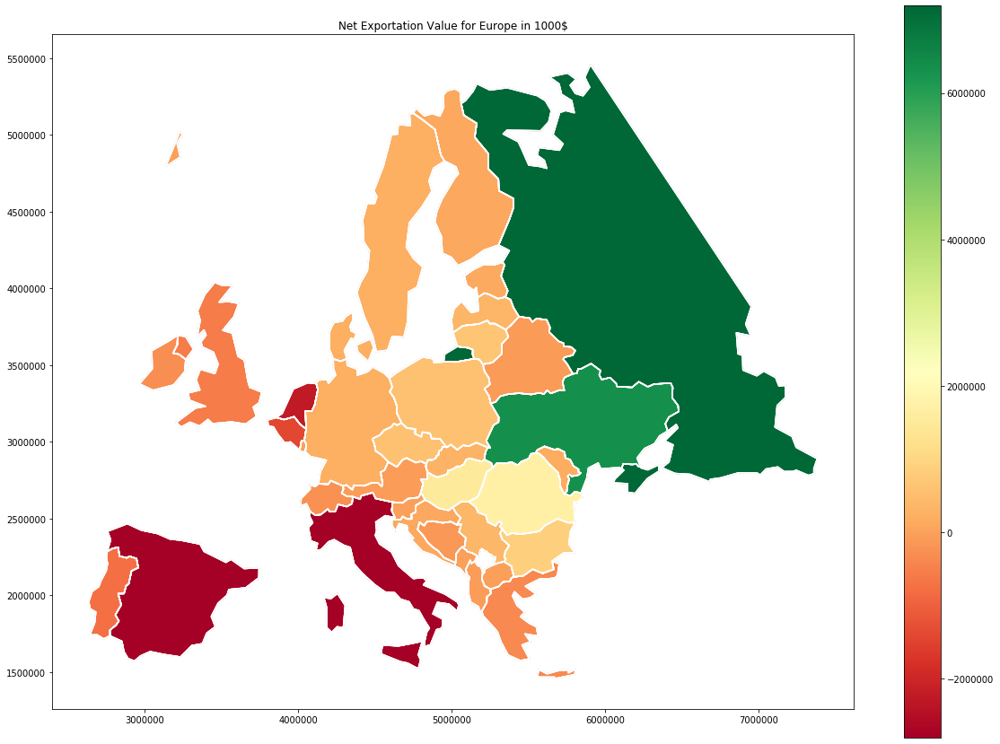

In [135]:
ax = europe.boundary.plot(color='white', edgecolor='black',figsize=(20,15))
europe.plot(ax = ax, edgecolor='black',column='profit',cmap='RdYlGn',legend=True);
ax.set_title('Net Exportation Value for Europe in 1000$')

Text(0.5, 1, 'Net Exportation Quantity for Europe in 1000$')

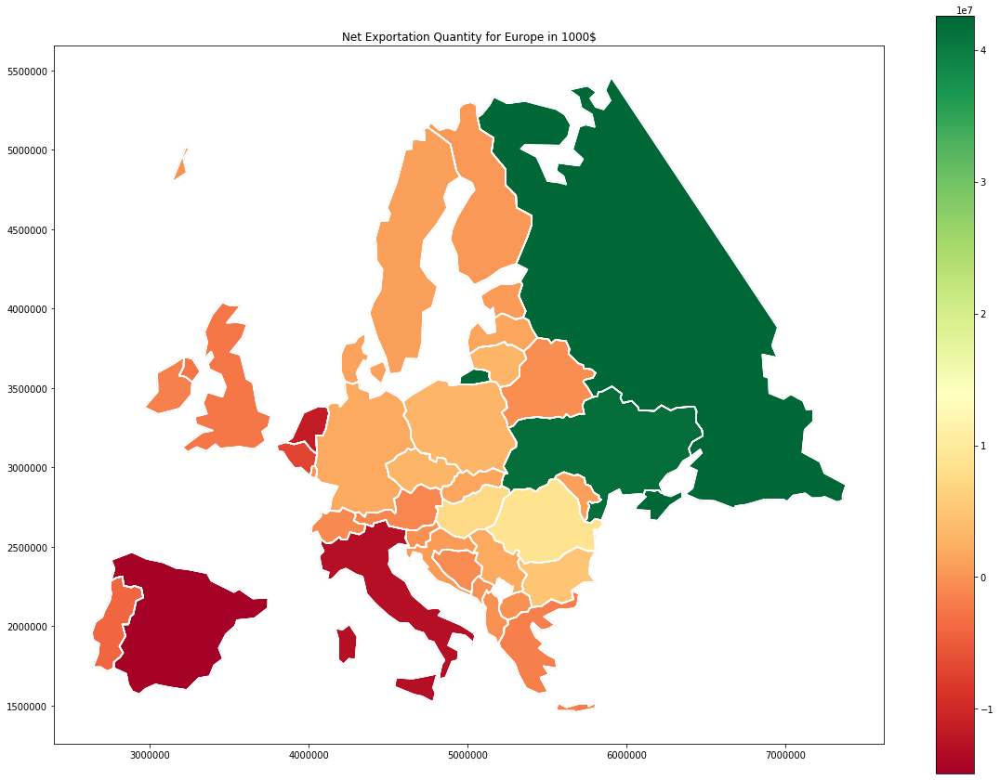

In [136]:
ax = europe.boundary.plot(color='white', edgecolor='black',figsize=(20,15))
europe.plot(ax = ax, edgecolor='black',column='diff_quantity',cmap='RdYlGn',legend=True);
ax.set_title('Net Exportation Quantity for Europe in 1000$')

<a id='plots4'></a>
### 7.C Third Example : Most Exported Crop in Africa

In [142]:
df_import_export

,area,item_x,year,unit,hs12_code,parent_group,child_group,export_quantity,export_value,import_quantity,import_value,iso3_code,country_code
0,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
1,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
2,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
3,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
4,Afghanistan,Almonds shelled,1961,tonnes,080212,8,802,0.0,0.0,0.0,0.0,AFG,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8972345,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181
8972346,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181
8972347,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181
8972348,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181


In [143]:
df_import_export[df_import_export['country_code'].isin(dicts.get(list_group[0]))]

,area,item_x,year,unit,hs12_code,parent_group,child_group,export_quantity,export_value,import_quantity,import_value,iso3_code,country_code
62946,Algeria,Alfalfa meal and pellets,1968,tonnes,121410,12,1214,0.0,0.0,135.0,10.0,DZA,4
62947,Algeria,Alfalfa meal and pellets,1968,tonnes,121410,12,1214,0.0,0.0,135.0,10.0,DZA,4
62948,Algeria,Alfalfa meal and pellets,1968,tonnes,121410,12,1214,0.0,0.0,135.0,10.0,DZA,4
62949,Algeria,Alfalfa meal and pellets,1969,tonnes,121410,12,1214,0.0,0.0,680.0,50.0,DZA,4
62950,Algeria,Alfalfa meal and pellets,1969,tonnes,121410,12,1214,0.0,0.0,680.0,50.0,DZA,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8972345,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181
8972346,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181
8972347,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181
8972348,Zimbabwe,"Yoghurt, concentrated or not",2017,tonnes,040310,4,403,2.0,3.0,0.0,0.0,ZWE,181


In [144]:
tmp = df_import_export[df_import_export['country_code'].isin(dicts.get(list_group[0]))]

In [145]:
tmp = tmp.groupby(['parent_group','year'])['export_quantity','export_value','import_quantity','import_value'].sum().reset_index()

In [146]:
tmp.head()

,parent_group,year,export_quantity,export_value,import_quantity,import_value
0,2,1961,294570.0,151749.0,315789.0,210430.0
1,2,1962,314969.0,165053.0,247177.0,171496.0
2,2,1963,321918.0,166660.0,256486.0,163883.0
3,2,1964,382174.0,210220.0,232839.0,143777.0
4,2,1965,427840.0,254938.0,235057.0,168766.0


In [147]:
tmp = tmp[tmp.year==2017]

In [148]:
tmp['diff_quantity'] = tmp['export_quantity'] - tmp['import_quantity']
tmp['profit'] = tmp['export_value'] - tmp['import_value']
tmp.head()

,parent_group,year,export_quantity,export_value,import_quantity,import_value,diff_quantity,profit
56,2,2017,784576.0,2143942.0,13152438.0,19317146.0,-12367862.0,-17173204.0
113,4,2017,4295581.0,7966830.0,15192673.0,32557525.0,-10897092.0,-24590695.0
170,5,2017,0.0,8671352.0,0.0,3291899.0,0.0,5379453.0
227,7,2017,23779088.0,17994600.0,21491814.0,13056238.0,2287274.0,4938362.0
284,8,2017,38058337.0,41594219.0,7008050.0,6361678.0,31050287.0,35232541.0


In [149]:
tmp.sort_values('diff_quantity',ascending=False)

,parent_group,year,export_quantity,export_value,import_quantity,import_value,diff_quantity,profit
284,8,2017,38058337.0,41594219.0,7008050.0,6361678.0,31050287.0,35232541.0
797,18,2017,15637612.0,40115266.0,874162.0,2773934.0,14763450.0,37341332.0
1481,52,2017,6829830.0,10601886.0,1012225.0,1618867.0,5817605.0,8983019.0
341,9,2017,9117341.0,30339631.0,3569680.0,9003993.0,5547661.0,21335638.0
1253,40,2017,4414977.0,5985295.0,263284.0,505069.0,4151693.0,5480226.0
227,7,2017,23779088.0,17994600.0,21491814.0,13056238.0,2287274.0,4938362.0
512,12,2017,12730086.0,10222196.0,10615325.0,6732911.0,2114761.0,3489285.0
1139,24,2017,3301706.0,15260563.0,1407920.0,11388159.0,1893786.0,3872404.0
1424,51,2017,264400.0,1403011.0,57356.0,255190.0,207044.0,1147821.0
1310,41,2017,262955.0,358818.0,110379.0,90089.0,152576.0,268729.0


Comments : "Fruit and nuts, edible; peel of citrus fruit or melons" that are the most exported and cereals that are the most imported

<a id='ccl'></a>
# 8. Conclusion and next steps

### What we have done so far : 
- Removed the nan values from the dataframea and merged the two dataframes (Trade and Trades 2017)
- Analysed each item in the trade dataframe and we mapped it to its core product in crops
- Prepare the dataframe to be grouped by country
- Prepare the dataframe to be grouped by crops category
- All the Elements (Type of value measured) were changed so for one Country, one crop and one specific year we can obtain the Import Value/Quantity, Export Value/Quantity, Production, Area Harvested and Yield on the same row. As you can see with that dataframe it’s really convenient to extract some information on countries, group of countries, crops or group of crops. We can easily compute for example the evolution for one group of crops over time in one region.
- First example on the “Cereals” category with Folium 

### Next steps : 
- Answer our research questions. Indeed, we first expressed the idea to look at the country which imported the most or exported the most and which type of crops was the most produced/traded. 
- We also want to analyze the supply chain of some categories of products at a global scale first and then dive in into specific regions and see the differences between countries or crops. Can we group them 
- We thought of using K-Means clustering method. Looking at the data, voir si des clusters apparaissent avec les crops, ou les trades et comparer aux clusters habituels : clusterings géographiques(continents, Nord/Sud) clustering social : (Pays en développement, pays développé)
- Evolution through years of certain crops and links to certain events or trends in particular. 
- Come up with some nice interactive visualization methods with Folium so the user can select one group of crops for one specific year and it appears automatically on the map with some characteristics for each country (for example most produced crop, most exported, most imported …) when the user click on it.


<a id='teaser'></a>
# 9. Teaser
We would like to use Folium to enable good geographic visualisations of importations and exportations of goods. It will rend the investigations of differents goods much easier. Below is a result of what we would do with cereals in 2017.

Note, a geojson is need for Folium. Json can be found ===> [here:](https://github.com/python-visualization/folium/blob/master/examples/data/world-countries.json) <====

Note: Notebook is fully and quickly runnable from here.

In [150]:
df_cereals_2017_folium = pd.read_pickle("./df_cereals_2017_folium.pkl")
df_cereals_2017_folium

,area,country_code,iso3_code,export_quantity,export_value,import_quantity,import_value,diff_quantity,profit
0,Afghanistan,2,AFG,0.0,0.0,2302706.0,461944.0,-2302706.0,-461944.0
1,Albania,3,ALB,111.0,339.0,818526.0,162303.0,-818415.0,-161964.0
2,Algeria,4,DZA,42.0,42.0,38325831.0,8013564.0,-38325789.0,-8013522.0
3,American Samoa,5,ASM,0.0,0.0,0.0,0.0,0.0,0.0
4,Angola,7,AGO,3985.0,390.0,1084995.0,259000.0,-1081010.0,-258610.0
...,...,...,...,...,...,...,...,...,...
198,Venezuela (Bolivarian Republic of),236,VEN,60.0,32.0,9959304.0,2807464.0,-9959244.0,-2807432.0
199,Viet Nam,237,VNM,336456.0,111144.0,49815504.0,10139944.0,-49479048.0,-10028800.0
200,Yemen,249,YEM,558.0,216.0,22766514.0,4778268.0,-22765956.0,-4778052.0
201,Zambia,251,ZMB,1965510.0,587736.0,341058.0,143178.0,1624452.0,444558.0


In [151]:
def show_production_countries(df, profit=True, filename='data/countries_profit.html'):
    """
    Complete function that takes some predefined df and output a map of the requested food for a given year.
    Show a folium map and then save the plot in an html file
    """
    look_word = 'profit' if profit else 'diff_quantity'
    min_profit = df[look_word].min()
    max_profit = df[look_word].max()

    countries = geopandas.read_file('data/world-countries.json')
    cm = countries.merge(df, left_on='id', right_on='iso3_code')
    cm[look_word] = cm[look_word].apply(lambda value : f'{int(value):,}')
    val_or_q = 'value' if profit else 'quantity'
    cm['export_' + val_or_q] = cm['export_' + val_or_q].apply(lambda value : f'{int(value):,}')
    cm['import_' + val_or_q] = cm['import_' + val_or_q].apply(lambda value : f'{int(value):,}')
    cm.to_file("data/countries-production.json", driver='GeoJSON')
    geo_json_data = json.load(open('data/countries-production.json'))

    def my_color_function(feature):
        """Maps high values to green and negative values to red."""
        if len(df[df['iso3_code'] == feature['properties']['id']][look_word]) == 0:
            return '#ffffff'
        value = df[df['iso3_code'] == feature['properties']['id']][look_word].iloc[0]
        if value > 0:
            green = hex(127 + int((value / max_profit) * 255 / 2 ))[-2:]
            return '#00' + green + '00'
        else:
            red = hex(int(127 + (value / min_profit) * 255 / 2 ))[-2:]
            return '#' + red + '00' + '00'

    def my_highlight_function(feature):
        return {
            'fillColor': 'black',
            'color' : 'black',
            'weight' : 3,
            'dashArray' : '5, 5'
            }


    m = folium.Map([40,0], zoom_start=2)

    folium.GeoJson(
        geo_json_data,
        style_function=lambda feature: {
            'fillColor': my_color_function(feature),
            'color' : 'black',
            'weight' : 1.5,
            'dashArray' : '5, 5'
            },
        highlight_function=my_highlight_function,
        tooltip=folium.features.GeoJsonTooltip(
            fields=['name', look_word, 'export_' + val_or_q, 'import_' + val_or_q],
            aliases=['State name:', look_word + ':', 'Export ' + val_or_q + ":", 'Import ' + val_or_q + ":"],
        )
        ).add_to(m)
    m.save(filename)
    return m
        

In case Folium doesn't render well on unrunned notebook, we strongly encourage you to check out directly our generated html files `Countries_Cereals_2017_Quantity.html` and `Countries_Cereals_2017_Profit.html`. Ottherwise, enjoy the following cells.

In [152]:
show_production_countries(df_cereals_2017_folium, False, './Countries_Cereals_2017_Quantity.html')

In [153]:
show_production_countries(df_cereals_2017_folium, True, './Countries_Cereals_2017_Profit.html')

---

<a id='milestone3'></a>
## MILESTONE 3

***Disclaimer:*** *This part of the notebook creates statistics and plots on our dataset.
In this part, we focused on providing clean and efficient code, as well as nice visualisations and statistics. 
The interpretations of our results and the story behind each crop can be found on our "data story" website and is not detailled here.*

<a id='starting'></a>
## 0. Imports and load data
##### Run only if you are starting from here.

In [249]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import pickle
import re
import nltk
import geopandas

from shapely.geometry import Polygon

import folium
import json

# visualisation
from folium import plugins
import json
import math
from folium import IFrame
import branca

In [183]:
crops_df = pd.read_pickle('./data/crops_df.pkl')
trades_df = pd.read_pickle('./data/trades_df.pkl')

<a id='df_construction'></a>
## 1. Final dataframe construction process

***Disclaimer:*** *Some part of the code in the cells and functions below reuse stuff that had already been done partially in Milestone 2, but in a cleaner and more organised way.*

In [184]:
ugly_df = crops_df.merge(trades_df, on=['area_code', 'year', 'item_key'], suffixes=('_crops', '_trades'), how='outer')

In [185]:
ugly_df.to_pickle('./data/ugly_df.zip', compression='zip')

In [186]:
def df_construction(df):
    '''
    Final function for building the dataframe from the one passed as parameter.
    '''
    
    raw_df = df.copy()
    raw_df = raw_df[~(raw_df.item_key=='NAC')]
    
    # Match keys to fill Nan from outer join
    dict_crops_key = np.load('./data/dict_crops_key.npy',allow_pickle='TRUE').item()
    inv_map_crops = {v: k for k, v in dict_crops_key.items()}
    inv_map_crops['sugar beet ']=inv_map_crops['sugar beet']
    inv_map_crops[' sugar cane']=inv_map_crops['sugar cane']


    print('Completing missing item_crops.')
    raw_df['item_crops'] = raw_df.item_key.apply(lambda key: inv_map_crops[key] if not pd.isnull(key) else 'remove')
    raw_df = raw_df[raw_df.item_crops != 'remove']

    # reorganize columns by pivoting twice
    df_final = double_pivot(raw_df)

    print('Adding ISO3 code.')

    # reload country to do the mapping for Folium
    country_df = pd.read_csv('Data/GroupsCountry.csv')

    # Add the ISO3 Code 
    df = df_final.merge(country_df[['Country Code', 'Country','ISO3 Code']].drop_duplicates(), \
                      how='left',left_on='area_code',right_on='Country Code').drop(['Country Code'],axis=1)

    #TODO : delete these / delete these lines / put back the groups
    #df['Country']=df['Country'].mask(pd.isnull, df['area_crops'])
    #df['Country']=df['Country'].mask(pd.isnull, df['area_trades'])


    print("Loading group crops.")
    # load group crops df
    groups_df = load_group_crops_df()

    print("Mergin groups.")
    # merge both 
    result_df = df.merge(groups_df, how='left', left_on='item_code_crops',right_on='item_code')\
                        .drop(['item_code_crops', 'item_code'], axis=1)
    
    print('Completing missing item_crops again.')
    result_df['item_crops'] = result_df.item_key.apply(lambda key: inv_map_crops[key] if not pd.isnull(key) else 'remove')
    result_df = result_df[result_df.item_crops != 'remove']

    return result_df

In [187]:
def double_pivot(df):
    '''
    Helper function for df_construction.
    Performs pivoting twice on the dataframe passed as parameter : 
    once for the trades characteristics (import/export quantity, import/export values) 
    once for the crops characteristics (production,yield, area harvested). 
    Returns a dataframe having these characteristics as columns instead of several lines.'''
    
    #index_prod = ['area_code', 'item_code_crops', 'item_crops', 'year','item_trades']
    index_prod = ['area_code', 'item_code_crops', 'item_crops', 'item_key', 'year']
    
    print('Pivoting from crops elements.')
    # pivot column 'element crops'
    production_df = df.pivot_table(values=['value_crops'],\
                                      index=index_prod,\
                                      columns=['element_crops'], dropna=False).reset_index()
    production_df.columns = [' '.join(col).strip() for col in production_df.columns.values]
    production_df.rename(columns= {'value_crops Area harvested': 'area_harvested', 'value_crops Production': 'production',\
                   'value_crops Yield':'yield'}, inplace=True)
    
    
    #index_trades = ['area_code', 'item_code_crops', 'item_crops', 'year', 'item_trades']
    index_trades = ['area_code', 'year', 'item_trades', 'item_key']

    print('Pivoting from trades elements.')
    # pivot column 'element trades'
    trades_df = df.pivot_table(values=['value_trades'],\
                            index=index_trades,\
                            columns=['element_trades'], dropna=False).reset_index()

    # deal with index to flatten
    trades_df.columns = [' '.join(col).strip() for col in trades_df.columns.values]

    # rename columns according to our nomenclature
    trades_df.rename(columns= {'value_trades Export Quantity': 'export_q', 'value_trades Export Value': 'export_v',\
                       'value_trades Import Quantity':'import_q', 'value_trades Import Value': 'import_v'}, inplace=True)
    
    print('Merge two pivoted tables.')
    merged_df = production_df.merge(trades_df, \
                                how='outer', \
                                on =['area_code', 'year', 'item_key'])
    
    return merged_df

In [188]:
def load_group_crops_df():
    '''
    Helper function for df_construction.
    Enables integrating group of crops in the final dataset.'''
    
    #Quickly load the data : 
    group_crops_df = pd.read_csv('data/GroupCrops.csv')
    #Column names to lower case
    group_crops_df.columns = map(lambda name : name.lower().replace(' ', '_'), group_crops_df.columns) 

    # Load the UN Comtrade Commodity Classifications :
    UNCCC_df = pd.read_excel('data/UNCCC.xlsx')
    # Keep the classification we are interested in (H4)
    HS12_df = UNCCC_df[UNCCC_df.Classification=='H4']
    
    # remove Nan values
    group_crops_cleaned_df = group_crops_df[~group_crops_df['hs12_code'].isnull()]
    
    # If the items is assigned mutliple labels, we only keep the first one
    HS12_Code = group_crops_cleaned_df['hs12_code'].str.split(', ',expand=True).loc[:,0]
    
    group_crops_cleaned_df = pd\
                            .concat([group_crops_cleaned_df,HS12_Code],axis=1)\
                            .drop(['factor','hs_code','hs07_code','cpc_code','hs12_code', \
                                   'item_group_code', 'item_group', 'item'],axis=1)
    
    group_crops_cleaned_df.rename(columns={0:'hs12_code'},inplace=True)
    
    # Add parent and child codes
    group_crops_cleaned_df['parent_group'] = group_crops_cleaned_df['hs12_code'].str[:2]#.astype(int)
    group_crops_cleaned_df['child_group'] = group_crops_cleaned_df['hs12_code'].str[:4]#.astype(int)
    
    # Add parent description
    group_crops_cleaned_df = group_crops_cleaned_df\
                        .merge(HS12_df[['Code', 'Description']], how='inner', left_on='parent_group', right_on='Code')\
                        .drop(['Code'], axis=1)

    group_crops_cleaned_df.rename(columns={'Description':'parent_description'}, inplace=True)
    
    # Add child description
    group_crops_cleaned_df = group_crops_cleaned_df\
                        .merge(HS12_df[['Code', 'Description']], how='inner', left_on='child_group', right_on='Code')\
                        .drop(['Code'], axis=1)

    group_crops_cleaned_df.rename(columns={'Description':'child_description'}, inplace=True)
    
    # drop duplicates
    group_crops_cleaned_df.drop_duplicates(inplace=True)
    
    return group_crops_cleaned_df

In [247]:
final_df = df_construction(ugly_df)

In [248]:
#final_df.to_pickle('./data/final_df.pkl')

<a id='visualisation'></a>
## 2. Visualisation tools
The functions below enable creating maps for visualising our statistics and highlighting interesting facts.

In [251]:
def to_hex_c(color):
    res = hex(int(color * 255))[2:]
    return '0' + res if len(res) == 1 else res

def show_production_all_countries(df, year, products=None, coloring='profit', filename='folium/countries_profit.html', cmap='inferno', diverging=False, normalized=True):
    """
    Complete function that takes some predefined df and output a map of the requested food for a given year.
    Show a folium map and then save the plot in an html file
    """
    
    
    df = df[df['year'] == year]
    df = df.replace([np.inf, -np.inf], np.nan)
    world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
    
    # Debugging known anomalies
    world.at[21, 'iso_a3'] = 'NOR'
    world.at[43, 'iso_a3'] = 'FRA'
    world.at[160, 'iso_a3'] = 'CYP'
    world.at[167, 'iso_a3'] = 'SOM'
    world.at[174, 'iso_a3'] = 'RKS'
    
    df = df.merge(world[['pop_est', 'iso_a3']], left_on='ISO3 Code', right_on='iso_a3', how='outer')
    global_min = 0
    global_max = 1
    highest_population = world['pop_est'].max()
    if normalized:
        
        df['profit_norm'] = df['profit'] / df['pop_est']
        df['export_v_norm'] = df['export_v'] / df['pop_est']
        df['import_v_norm'] = df['import_v'] / df['pop_est']
        df['diff_quantity_norm'] = df['diff_quantity'] / df['pop_est']
        df['export_q_norm'] = df['export_q'] / df['pop_est']
        df['import_q_norm'] = df['import_q'] / df['pop_est']
    
    isFirst = True
        
    if products == None:
        products = df.item_trades[:10]
    
    
    #layer_types = ['value', 'quantity']
    m = folium.Map([40,0], zoom_start=2, min_zoom=2)
    #fg = folium.FeatureGroup(overlay=True, name='groups', control=False)
    #m.add_child(fg)
    
    by_product = df.groupby('item_trades')
    i = 0
    for product in products:
        df_product = by_product.get_group(product)
        
        global_min = min(global_min, df_product[coloring].min())
        global_max = max(global_max, df_product[coloring].max())

        countries = geopandas.read_file('data/world-countries.json')
        #cm = countries.merge(df, left_on='id', right_on='iso3_code')
        cm = countries.merge(df_product, left_on='id', right_on='ISO3 Code')
        
             
        
        cm['profit'] = cm['profit'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['export_v'] = cm['export_v'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['import_v'] = cm['import_v'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['pop_est'] = cm['pop_est'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')

        cm['diff_quantity'] = cm['diff_quantity'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['export_q'] = cm['export_q'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['import_q'] = cm['import_q'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')

        cm['export_vpq'] = cm['export_vpq'].apply(lambda value : 0 if math.isnan(value) else f'{value:.2f}')
        cm['import_vpq'] = cm['import_vpq'].apply(lambda value : 0 if math.isnan(value) else f'{value:.2f}')
        cm['product'] = product
                
        if normalized:
            cm = cm[['id', 'name', 'product', 'pop_est', 'profit_norm', 'export_v_norm', 'import_v_norm', 'diff_quantity_norm', 'export_q_norm', 'import_q_norm',
                 'geometry', 'item_trades', 'export_q', 'import_q', 'export_v', 'import_v', 'ISO3 Code', 'profit', 'diff_quantity', 'import_vpq', 'export_vpq']]
        else:
            cm = cm[['id', 'name', 'product', 'pop_est',
                 'geometry', 'item_trades', 'export_q', 'import_q', 'export_v', 'import_v', 'ISO3 Code', 'profit', 'diff_quantity', 'import_vpq', 'export_vpq']]
        cm.to_file("data/countries-production.json", driver='GeoJSON')
        geo_json_data = json.load(open('data/countries-production.json'))

        def my_color_function(feature):
            """Maps high values to green and negative values to red."""
            
            color_feature = coloring
            if normalized:
                color_feature += "_norm"
            
            
            if len(df[df['ISO3 Code'] == feature['properties']['id']][color_feature]) == 0:
                return '#ffffff'
            value = df[(df['ISO3 Code'] == feature['properties']['id'])&(df['item_trades'] == feature['properties']['item_trades'])][color_feature].iloc[0]
            feat = feature['properties']['item_trades']
            min_val = (df[df['item_trades']== feat])[color_feature].min()
            max_val = (df[df['item_trades']== feat])[color_feature].max()
            min_val = 0 if math.isinf(min_val) else min_val
            max_val = 100000 if math.isinf(max_val) else max_val

            if math.isnan(value) or math.isinf(value):
                return "#BEBEBE"
            
            
            
            colormap = plt.get_cmap(cmap)
            if diverging:
                if value > 0:
                    color = colormap(0.5 + value/(2*max_val))
                else:
                    color = colormap(0.5 - value/(2*min_val))
            else:
                color = colormap( (value - min_val)/(max_val - min_val))
                
                
            return '#' + to_hex_c(color[0]) + to_hex_c(color[1]) + to_hex_c(color[2])
            
            

        def my_highlight_function(feature):
            return {
                'fillColor': 'black',
                'fillOpacity': 0.5,
                'color' : 'black',
                'weight' : 3,
                'dashArray' : '5, 5'
                }

        
        layer = folium.GeoJson(
            geo_json_data,
            style_function=lambda feature: {
                'fillColor': my_color_function(feature),
                'fillOpacity': 0.9,
                'color' : 'black',
                'weight' : 1.5,
                'dashArray' : '5, 5'
                },
            overlay=True,
            show=isFirst,
            highlight_function=my_highlight_function,
            tooltip=folium.features.GeoJsonTooltip(
                opacity=1,
                fields=['name', 'pop_est', 'product', 'profit', 'export_v', 'import_v', 'diff_quantity', 'export_q', 'import_q', 'export_vpq', 'import_vpq'],
                aliases=['State name:', 'population estimation [Hab.]:', 'Product:',  'Gross Profit [1,000$]:', 'Export value [1,000$]:', 'Import value [1,000$]: ', 'Difference of quantity [Tonnes]:', 'Export quantity [Tonnes]:', 'Import quantity [Tonnes]:', 'Export V/Q [1,000$/Tonnes]:', 'Import V/Q [1,000$/Tonnes]:'],
                )
            )
        #g = plugins.FeatureGroupSubGroup(fg, coloring, show=False)
        #m.add_child(g)
        isFirst = False
        
        layer.layer_name = product
        layer.add_to(m)
        
        #layer.add_to(fg)
        
    plugins.Fullscreen(
        position='bottomright',
        title='Expand me',
        title_cancel='Exit me',
        force_separate_button=True
    ).add_to(m)
    if normalized:
        global_min /= highest_population
        global_max /= highest_population
        
    colormapL = branca.colormap.linear.RdYlGn_09.scale(global_min, global_max)
    colormapL = colormapL.to_step(index=[global_min, global_min/2, 0, global_max/2, global_max])
    
    
    title = {'profit' : 'Gross Profit', 'diff_quantity' : 'Difference of Quantity', 'import_q' : 'import Quantity', 'export_q': 'Export Quantity',
            'import_v': 'Import Value', 'export_v' : 'Export Value', 'import_vpq' : 'Import Value per Quantity', 'export_vpq' : 'Export Value per Quantity'}
    colormapL.caption = title.get(coloring, coloring) + " (in " + str(year) +")" if not normalized else title.get(coloring, coloring) + " per population" + " (in " + str(year) +")"
    colormapL.add_to(m)  
    folium.LayerControl().add_to(m)
    
    m.save(filename)
    return m

In [252]:
def show_step_production_all_countries(df, year, products=None, coloring='profit', filename='folium/countries_profit.html', cmap='inferno', diverging=False, normalized=True):
    """
    Complete function that takes some predefined df and output a map of the requested food for a given year.
    Show a folium map and then save the plot in an html file
    """
    
    
    df = df[df['year'] == year]
    df = df.replace([np.inf, -np.inf], np.nan)
    world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
    
    # Debugging known anomalies
    world.at[21, 'iso_a3'] = 'NOR'
    world.at[43, 'iso_a3'] = 'FRA'
    world.at[160, 'iso_a3'] = 'CYP'
    world.at[167, 'iso_a3'] = 'SOM'
    world.at[174, 'iso_a3'] = 'RKS'
    
    df = df.merge(world[['pop_est', 'iso_a3']], left_on='ISO3 Code', right_on='iso_a3', how='outer')
    global_min = 0
    global_max = 1
    highest_population = world['pop_est'].max()
    if normalized:
        
        df['profit_norm'] = df['profit'] / df['pop_est']
        df['export_v_norm'] = df['export_v'] / df['pop_est']
        df['import_v_norm'] = df['import_v'] / df['pop_est']
        df['diff_quantity_norm'] = df['diff_quantity'] / df['pop_est']
        df['export_q_norm'] = df['export_q'] / df['pop_est']
        df['import_q_norm'] = df['import_q'] / df['pop_est']
    
    isFirst = True
        
    if products == None:
        products = df.item_trades[:10]
    
    
    #layer_types = ['value', 'quantity']
    m = folium.Map([40,0], zoom_start=2, min_zoom=2)
    #fg = folium.FeatureGroup(overlay=True, name='groups', control=False)
    #m.add_child(fg)
    
    by_product = df.groupby('item_trades')
    for i, product in enumerate(products):
        df_product = by_product.get_group(product)
        
        global_min = min(global_min, df_product[coloring].min())
        global_max = max(global_max, df_product[coloring].max())

        countries = geopandas.read_file('data/world-countries.json')
        #cm = countries.merge(df, left_on='id', right_on='iso3_code')
        cm = countries.merge(df_product, left_on='id', right_on='ISO3 Code')
        
        if i%2 == 0:
            cm.sort_values(by='export_q', ascending=False, inplace=True)
        else:
            cm.sort_values(by='import_q', ascending=False, inplace=True)
        cm = cm[:20]
        
        cm['min_export'] = cm['export_q'].min()
        cm['max_export'] = cm['export_q'].max()
        cm['min_import'] = cm['import_q'].min()
        cm['max_import'] = cm['import_q'].max()
             
        
        cm['profit'] = cm['profit'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['export_v'] = cm['export_v'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['import_v'] = cm['import_v'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['pop_est'] = cm['pop_est'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')

        cm['diff_quantity'] = cm['diff_quantity'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['export_q'] = cm['export_q'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')
        cm['import_q'] = cm['import_q'].apply(lambda value : 0 if math.isnan(value) else f'{int(value):,}')

        cm['export_vpq'] = cm['export_vpq'].apply(lambda value : 0 if math.isnan(value) else f'{value:.2f}')
        cm['import_vpq'] = cm['import_vpq'].apply(lambda value : 0 if math.isnan(value) else f'{value:.2f}')
        cm['index'] = i
        cm['product'] = product
        
        if normalized:
            cm = cm[['id', 'name', 'pop_est', 'product', 'profit_norm', 'export_v_norm', 'import_v_norm', 'diff_quantity_norm', 'export_q_norm', 'import_q_norm',
                 'geometry', 'item_trades', 'export_q', 'import_q', 'export_v', 'import_v', 'ISO3 Code', 'profit', 'diff_quantity', 'import_vpq', 'export_vpq', 'index']]
        else:
            cm = cm[['id', 'name', 'pop_est', 'product',
                 'geometry', 'item_trades', 'export_q', 'import_q', 'export_v', 'import_v', 'ISO3 Code', 'profit', 'diff_quantity', 'import_vpq', 'export_vpq', 'index', 'min_export', 'max_export', 'min_import', 'max_import']]

                
        cm.to_file("data/countries-production.json", driver='GeoJSON')
        geo_json_data = json.load(open('data/countries-production.json'))
        
        def choose_color_function(feature):
            return ([my_color_function1, my_color_function2, my_color_function3, my_color_function4])[feature['properties']['index']]

        def my_color_function1(feature):
            """Maps high values to green and negative values to red."""
            
            color_feature = "export_q"
            if normalized:
                color_feature += "_norm"
            
            
            if len(df[df['ISO3 Code'] == feature['properties']['id']][color_feature]) == 0:
                return '#ffffff'
            value = df[(df['ISO3 Code'] == feature['properties']['id'])&(df['item_trades'] == feature['properties']['item_trades'])][color_feature].iloc[0]
            feat = feature['properties']['item_trades']
            min_val = feature['properties']['min_export']
            max_val =  feature['properties']['max_export']
            min_val = 0 if math.isinf(min_val) else min_val
            max_val = 100000 if math.isinf(max_val) else max_val

            if math.isnan(value) or math.isinf(value):
                return "#BEBEBE"
            
            
            
            colormap = plt.get_cmap('Blues')
            if diverging:
                if value > 0:
                    color = colormap(0.5 + value/(2*max_val))
                else:
                    color = colormap(0.5 - value/(2*min_val))
            else:
                color = colormap( (value - min_val)/(max_val - min_val))
                
                
            return '#' + to_hex_c(color[0]) + to_hex_c(color[1]) + to_hex_c(color[2])
        
        def my_color_function2(feature):
            """Maps high values to green and negative values to red."""
            
            color_feature = "import_q"
            if normalized:
                color_feature += "_norm"
            
            
            if len(df[df['ISO3 Code'] == feature['properties']['id']][color_feature]) == 0:
                return '#ffffff'
            value = df[(df['ISO3 Code'] == feature['properties']['id'])&(df['item_trades'] == feature['properties']['item_trades'])][color_feature].iloc[0]
            feat = feature['properties']['item_trades']
            min_val = feature['properties']['min_import']
            max_val =  feature['properties']['max_import']
            min_val = 0 if math.isinf(min_val) else min_val
            max_val = 100000 if math.isinf(max_val) else max_val

            if math.isnan(value) or math.isinf(value):
                return "#BEBEBE"
            
            
            
            colormap = plt.get_cmap('Purples')
            if diverging:
                if value > 0:
                    color = colormap(0.5 + value/(2*max_val))
                else:
                    color = colormap(0.5 - value/(2*min_val))
            else:
                color = colormap( (value - min_val)/(max_val - min_val))
                
                
            return '#' + to_hex_c(color[0]) + to_hex_c(color[1]) + to_hex_c(color[2])
        
        def my_color_function3(feature):
            """Maps high values to green and negative values to red."""
            
            color_feature = 'export_q'
            if normalized:
                color_feature += "_norm"
            
            
            if len(df[df['ISO3 Code'] == feature['properties']['id']][color_feature]) == 0:
                return '#ffffff'
            value = df[(df['ISO3 Code'] == feature['properties']['id'])&(df['item_trades'] == feature['properties']['item_trades'])][color_feature].iloc[0]
            feat = feature['properties']['item_trades']
            min_val = feature['properties']['min_export']
            max_val =  feature['properties']['max_export']

            if math.isnan(value) or math.isinf(value):
                return "#BEBEBE"
            
            
            
            colormap = plt.get_cmap('Oranges')
            if diverging:
                if value > 0:
                    color = colormap(0.5 + value/(2*max_val))
                else:
                    color = colormap(0.5 - value/(2*min_val))
            else:
                color = colormap( (value - min_val)/(max_val - min_val))
                
                
            return '#' + to_hex_c(color[0]) + to_hex_c(color[1]) + to_hex_c(color[2])
        def my_color_function4(feature):
            """Maps high values to green and negative values to red."""
            
            color_feature = 'import_q'
            if normalized:
                color_feature += "_norm"
            
            
            if len(df[df['ISO3 Code'] == feature['properties']['id']][color_feature]) == 0:
                return '#ffffff'
            value = df[(df['ISO3 Code'] == feature['properties']['id'])&(df['item_trades'] == feature['properties']['item_trades'])][color_feature].iloc[0]
            feat = feature['properties']['item_trades']
            min_val = feature['properties']['min_import']
            max_val =  feature['properties']['max_import']
            min_val = 0 if math.isinf(min_val) else min_val
            max_val = 100000 if math.isinf(max_val) else max_val

            if math.isnan(value) or math.isinf(value):
                return "#BEBEBE"
            
            
            
            colormap = plt.get_cmap('Reds')
            if diverging:
                if value > 0:
                    color = colormap(0.5 + value/(2*max_val))
                else:
                    color = colormap(0.5 - value/(2*min_val))
            else:
                color = colormap( (value - min_val)/(max_val - min_val))
                
                
            return '#' + to_hex_c(color[0]) + to_hex_c(color[1]) + to_hex_c(color[2])
            
            
            

        def my_highlight_function(feature):
            return {
                'fillColor': 'black',
                'fillOpacity': 0.5,
                'color' : 'black',
                'weight' : 3,
                'dashArray' : '5, 5'
                }

        
        layer = folium.GeoJson(
            geo_json_data,
            style_function=lambda feature: {
                'fillColor': choose_color_function(feature)(feature),
                'fillOpacity': 0.5,
                'color' : 'black',
                'weight' : 1.5,
                'dashArray' : '5, 5'
                },
            overlay=True,
            show=isFirst,
            highlight_function=my_highlight_function,
            tooltip=folium.features.GeoJsonTooltip(
                opacity=1,
                fields=['name', 'pop_est', 'product', 'profit', 'export_v', 'import_v', 'diff_quantity', 'export_q', 'import_q', 'export_vpq', 'import_vpq'],
                aliases=['State name:', 'population estimation [Hab.]:', 'product:',  'Gross Profit [1,000$]:', 'Export value [1,000$]:', 'Import value [1,000$]: ', 'Difference of quantity [Tonnes]:', 'Export quantity [Tonnes]:', 'Import quantity [Tonnes]:', 'Export V/Q [1,000$/Tonnes]:', 'Import V/Q [1,000$/Tonnes]:'],
                )
            )
        #g = plugins.FeatureGroupSubGroup(fg, coloring, show=False)
        #m.add_child(g)
        isFirst = True
        
        map_color = ['Blue', 'Purple', 'Orange', 'Red']
        
        layer.layer_name = product + ' Export (in ' + map_color[i] + ')' if i % 2 == 0 else product + ' Import (in ' + map_color[i] + ')'
        layer.add_to(m)
        
        
        #layer.add_to(fg)
        
    plugins.Fullscreen(
        position='bottomright',
        title='Expand me',
        title_cancel='Exit me',
        force_separate_button=True
    ).add_to(m)
    if normalized:
        global_min /= highest_population
        global_max /= highest_population
        
    colormapL = branca.colormap.LinearColormap(colors=['blue','purple','orange', 'red'], index=[0,1,2,3],vmin=0,vmax=3)
    
    
    title = {'profit' : 'Gross Profit', 'diff_quantity' : 'Difference of Quantity', 'import_q' : 'import Quantity', 'export_q': 'Export Quantity',
            'import_v': 'Import Value', 'export_v' : 'Export Value', 'import_vpq' : 'Import Value per Quantity', 'export_vpq' : 'Export Value per Quantity'}
    colormapL.caption = "Tobacco Exporters, Tobacco Importers, Cigarette Exporters, Cigarette Importers"
    colormapL.add_to(m)  
    folium.LayerControl().add_to(m)
    
    m.save(filename)
    return m

<a id='our_items'></a>
## 3. The items of our datastory
#### Wheat, Avocado, Coffee, Tobacco
Let's build the dataframe for each of them.

Remark : as function `df_construction` performs pivoting twice, it is computationally very expensive and we cannot compute it on the whole dataset. As we decide to focus on only four crops, it is enough to compute four different datasets. Since we want to have data on the trades and crops at the same times, we select the lines based on the `item_key` column.

In [189]:
wheat_temp_df = ugly_df[(ugly_df.item_key == 'wheat')]
avocado_temp_df = ugly_df[(ugly_df.item_key == 'avocado')]
coffee_temp_df = ugly_df[(ugly_df.item_key == 'coffe')]
tobacco_temp_df = ugly_df[(ugly_df.item_key == 'tobacco')]

wheat_temp_df.shape, avocado_temp_df.shape, coffee_temp_df.shape, tobacco_temp_df.shape

((406048, 18), (58156, 18), (337055, 18), (325668, 18))

In [190]:
wheat_df = df_construction(wheat_temp_df)

Completing missing item_crops.
Pivoting from crops elements.
Pivoting from trades elements.
Merge two pivoted tables.
Adding ISO3 code.
Loading group crops.
Mergin groups.
Completing missing item_crops again.


In [191]:
avocado_df = df_construction(avocado_temp_df)

Completing missing item_crops.
Pivoting from crops elements.
Pivoting from trades elements.
Merge two pivoted tables.
Adding ISO3 code.
Loading group crops.
Mergin groups.
Completing missing item_crops again.


In [192]:
coffee_df = df_construction(coffee_temp_df)

Completing missing item_crops.
Pivoting from crops elements.
Pivoting from trades elements.
Merge two pivoted tables.
Adding ISO3 code.
Loading group crops.
Mergin groups.
Completing missing item_crops again.


In [193]:
tobacco_df = df_construction(tobacco_temp_df)

Completing missing item_crops.
Pivoting from crops elements.
Pivoting from trades elements.
Merge two pivoted tables.
Adding ISO3 code.
Loading group crops.
Mergin groups.
Completing missing item_crops again.


### Save as pickles

In [194]:
wheat_df.to_pickle('./data/wheat_df.pkl')
avocado_df.to_pickle('./data/avocado_df.pkl')
coffee_df.to_pickle('./data/coffee_df.pkl')
tobacco_df.to_pickle('./data/tobacco_df.pkl')

---

<a id='general'></a>
## 4. Global Analysis

In [195]:
sns.set_style('darkgrid')
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly
import math

### Introduction

Load the merged Dataframe

In [196]:
global_df = pd.read_pickle("data/final_df.pkl")

Load the extra csv file to be able to regroup the countries by region

In [197]:
df_country = pd.read_csv('Data/GroupsCountry.csv')
df_country.columns = map(lambda name : name.lower().replace(' ', '_'), df_country.columns) #Column names to lower case

Create a dictionnary that regroup all the countries in one country group. Each country group has an unique id ie. 5100 for Africa, 5000 for World, 5500 for Oceania ...

In [198]:
dicts = {}
keys = df_country['country_group_code'].unique()
for i in range(len(list_group)):
    dicts[list_group[i]]= df_country[df_country['country_group_code']==list_group[i]]['country_code'].unique()

In [199]:
# The key 5000 corresponds to the "world", we do that 
df_world = global_df[global_df.area_code.isin(dicts.get(5000))]

In [200]:
df_world.head()

,area_code,area_crops,item_crops,year,item_trades,area_harvested,production,yield,export_q,export_v,import_q,import_v,hs12_code,parent_group,child_group,parent_description,child_description,ISO3 Code
0,1,Armenia,Wheat,1992,Wheat,65500.0,141483.0,21600.0,NaN,NaN,400000.0,60000.0,100111,10,1001,Cereals,Wheat and meslin,ARM
1,1,Armenia,Wheat,1993,Wheat,97900.0,217900.0,22257.0,NaN,NaN,408000.0,59000.0,100111,10,1001,Cereals,Wheat and meslin,ARM
2,1,Armenia,Wheat,1993,"Flour, wheat",97900.0,217900.0,22257.0,NaN,NaN,46000.0,9400.0,100111,10,1001,Cereals,Wheat and meslin,ARM
3,1,Armenia,Wheat,1994,Wheat,85697.0,152900.0,17842.0,NaN,NaN,327000.0,52000.0,100111,10,1001,Cereals,Wheat and meslin,ARM
4,1,Armenia,Wheat,1994,"Flour, wheat",85697.0,152900.0,17842.0,NaN,NaN,55000.0,14700.0,100111,10,1001,Cereals,Wheat and meslin,ARM


In [201]:
# Creation of the dataset to analyze the production
df_world_unique = df_world.drop_duplicates(subset=['area_crops','item_crops','year'],keep='first')

In [202]:
# Group the dataframe by parent_group (categories are presented below)
df_groups = df_world_unique.groupby(['parent_group','year']).sum().reset_index()
df_groups_norm = df_groups.pivot(index='year', columns='parent_group', values='production').reset_index()

List of all the main categories : 

- 02 : Meat and edible meat offal
- 04 : Dairy produce; birds' eggs; natural honey; edible products of animal origin, not elsewhere -specified or included
- 05 : Animal originated products; not elsewhere specified or included
- 07 : Vegetables and certain roots and tubers; edible
- 08 : Fruit and nuts, edible; peel of citrus fruit or melons  
- 09 : Coffee, tea, mate and spices
- 10 : Cereals
- 11 : Products of the milling industry; malt, starches, inulin, wheat gluten
- 12 : Oil seeds and oleaginous fruits; miscellaneous grains, seeds and fruit, industrial or medicinal plants; straw and fodder
- 14 : Vegetable plaiting materials; vegetable products not elsewhere specified or included
- 15 : Animal or vegetable fats and oils and their cleavage products; prepared animal fats; animal or vegetable waxes
- 16 : Meat, fish or crustaceans, molluscs or other aquatic invertebrates; preparations thereof
- 17 : Sugars and sugar confectionery
- 18 : Cocoa and cocoa preparations
- 19 : Preparations of cereals, flour, starch or milk; pastrycooks' products
- 20 : Preparations of vegetables, fruit, nuts or other parts of plants
- 21 : Miscellaneous edible preparations
- 22 : Beverages, spirits and vinegar 
- 23 : Food industries, residues and wastes thereof; prepared animal fodder
- 24 : Tobacco and manufactured tobacco substitutes
- 38 : Chemical products n.e.c.
- 40 : Rubber and articles thereof
- 41 : Raw hides and skins (other than furskins) and leather
- 50 : Silk
- 51 : Wool, fine or coarse animal hair; horsehair yarn and woven fabric
- 52 : Cotton
- 53 : Vegetable textile fibres; paper yarn and woven fabrics of paper yarn

In [204]:
# Import World population
WorldPopulation = pd.read_excel('data/WorldPopulation.xlsx').sort_values(by='Year').reset_index().drop('index',axis=1)

**Plot the evolution of the production for each grop of crops and the world population:**

In [205]:
df_groups_px = df_groups.pivot(index='year', columns='parent_group', values='production').reset_index()

In [206]:
parent_group_legend = ['Vegetables','Fruit and nuts','Coffee, tea, mate','Cereals','Oil seeds',
       'Cocoa','Tobacco','Rubber','Vegetable textile fibres']
list_parent_group = ['07','08','09','10','12','18','24','40','53']

In [246]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

for i in range(len(parent_group_legend)):
    fig.add_trace(go.Scatter(
        x=df_groups_px.year,
        y=df_groups_px.loc[:,df_groups.parent_group.unique()[i]],
        name=parent_group_legend[i]),
        secondary_y=False
    )
    
fig.add_trace(go.Scatter(
        x=WorldPopulation.Year,
        y=WorldPopulation.WorldPopulation,
        name="World Population"),
        secondary_y=True)    
    
fig.update_layout(
    title="Production of Crops per Category",
    yaxis_title="Production [tonnes]",
    legend=go.layout.Legend(
        font=dict(
            size=10)
))
  
fig.update_yaxes(title_text="Production [tonnes]",  range=[0, 8e9],secondary_y=False)
fig.update_yaxes(title_text="World Population [people]", range=[0, 8e9],secondary_y=True)


fig.show()

In [208]:
# Save the figure in html format for the datastory
plotly.offline.plot(fig,filename='AllProds.html')

'AllProds.html'

**Plot the indexed evolution of the production for each grop of crops and the world population :**

In [209]:
# Compute the indexed production
df_groups_px_norm = df_groups_norm.loc[:,list_parent_group]/df_groups_norm.loc[:,list_parent_group].loc[0,:]

In [210]:
# Compute the indexed world population : 
WorldPopulation_norm = WorldPopulation.loc[:,"WorldPopulation"]/WorldPopulation.loc[:,"WorldPopulation"][0]

In [211]:
fig = go.Figure()
for i in range(len(parent_group_legend)):
    fig.add_trace(go.Scatter(
        x=df_groups_px.year,
        y=100*(df_groups_px_norm.loc[:,df_groups.parent_group.unique()[i]]),
        mode='lines',
        showlegend=True,
        name=parent_group_legend[i],
    ))    
fig.add_trace(go.Scatter(
        x=df_groups_px.year,
        y=100*WorldPopulation_norm,
        mode='lines',
        showlegend=True,
        name=parent_group_legend[i],
    ))    
    
    
fig.update_layout(
    title="Indexed Production of Crops per Category and world population",
    yaxis_title="Indexed production or world population[%]",
    legend=go.layout.Legend(
        font=dict(
            size=10)
))
fig.show()

In [212]:
# Save the figure for the data story :
plotly.offline.plot(fig,filename='IndexedProds.html')

'IndexedProds.html'

**Scatter plot for each crop :**

In [213]:
# CREATION YEAR DF = 2016
df_year=df_world[df_world.year==2016] # For the VPQ

df_year_unique=df_world_unique[df_world_unique.year==2016] # For the production

In [214]:
# DF for the VPQ
df_crops_prod = df_year.groupby(['parent_group','parent_description','item_crops']).sum().reset_index()
df_crops_prod['import_vpq'] = df_crops_prod.import_v/df_crops_prod.import_q

In [215]:
# DF for the production
df_crops_prod_unique = df_year_unique.groupby(['parent_group','parent_description','item_crops']).sum().reset_index() # Keep only the production value

In [217]:
list_crops = ['Avocados','Coffee, green','Tobacco, unmanufactured','Wheat']

In [218]:
fig = go.Figure()
for i in range(len(parent_group_legend)):
    fig.add_trace(go.Scatter(
        x=df_crops_prod_unique[df_crops_prod_unique.parent_group==df_groups.parent_group.unique()[i]].production,
        y=df_crops_prod[df_crops_prod.parent_group==df_groups.parent_group.unique()[i]].import_vpq,
        mode='markers',
        text=df_crops_prod[df_crops_prod.parent_group==df_groups.parent_group.unique()[i]].item_crops,
        name=parent_group_legend[i]
    ))

# Transform the axis in log
fig.update_xaxes(type="log")
fig.update_yaxes(type="log")

# Add the annotation to highlight our crop
fig.add_annotation(
    go.layout.Annotation(
            x=math.log10(749016800),
            y=math.log10(0.2215844),
            text="Wheat")
)

fig.add_annotation(
    go.layout.Annotation(
            x=math.log10(5495334),
            y=math.log10(2.3529),
            text="Avocados")
)

fig.add_annotation(
    go.layout.Annotation(
            x=math.log10(6398885.0),
            y=math.log10(10.06832),
            text="Tobacco, unmanufactured")
)

fig.add_annotation(
    go.layout.Annotation(
            x=math.log10(9315121.0),
            y=math.log10(3.670396),
            text="Coffee, green")
)

fig.update_layout(
    title="Worldwide Production in 2016 ",
    xaxis_title="Production [tones]",
    yaxis_title="VPQ [$/tonne]",
    legend=go.layout.Legend(
        font=dict(
            size=10)
))
fig.show()

In [219]:
# Save the figure for the data story :
plotly.offline.plot(fig,filename='WorldwideProds.html')

'WorldwideProds.html'

---

<a id='wheat'></a>
## 5. Wheat's story

In [225]:
# load the specific dataset for the wheat
df_wheat = pd.read_pickle("data/wheat_df.pkl")

In [226]:
df_wheat_production = df_wheat.dropna(subset=['production','Country']).drop_duplicates(subset=['Country','year'])

In [227]:
# Notice that we have the same production than the scatter plot for the year 2016, so it's correct
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_wheat_production.groupby(['year']).sum().reset_index().year,
    y=df_wheat_production.groupby(['year']).sum().reset_index().production,
    mode='lines',
    showlegend=True,
    name="Wheat Production",
    ))

**Time serie plot for the import and export VPQ :**

In [228]:
df_wheat_trades_vpq = df_wheat.dropna(subset=['Country']).groupby(['year']).sum().reset_index()
df_wheat_trades_vpq['import_vpq'] = df_wheat_trades_vpq.import_v/df_wheat_trades_vpq.import_q
df_wheat_trades_vpq['export_vpq'] = df_wheat_trades_vpq.export_v/df_wheat_trades_vpq.export_q
df_wheat_trades_vpq.head()

,year,area_code,area_harvested,production,yield,export_q,export_v,import_q,import_v,import_vpq,export_vpq
0,1961,136285,1.021047e+09,1.111786e+09,6488500.0,45802931.0,3023322.0,45569947.0,3369220.0,0.073935,0.066007
1,1962,136285,1.037773e+09,1.251596e+09,6928150.0,44520096.0,3035950.0,41359658.0,3171724.0,0.076686,0.068193
2,1963,136285,1.030651e+09,1.166697e+09,6681770.0,49255996.0,3324833.0,49589053.0,3718983.0,0.074996,0.067501
3,1964,136285,1.082696e+09,1.343958e+09,7181440.0,58882419.0,3991767.0,55401378.0,4292376.0,0.077478,0.067792
4,1965,136285,1.084899e+09,1.318230e+09,7420900.0,56207775.0,3576376.0,56228823.0,4134242.0,0.073525,0.063628


In [229]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_wheat_trades_vpq.year,
    y=df_wheat_trades_vpq.import_vpq,
    mode='lines',
    showlegend=True,
    name="Import VPQ",
    ))
fig.add_trace(go.Scatter(
    x=df_wheat_trades_vpq.year,
    y=df_wheat_trades_vpq.export_vpq,
    mode='lines',
    showlegend=True,
    name="Export VPQ",
    ))
# Set x-axis title
fig.update_layout(
    title="Import and Export Value per Quantity for the Wheat",
    xaxis_title="Year",
    yaxis_title="VPQ [1000$/tonne]")
fig.show()

In [230]:
# Save the figure for the data story :
plotly.offline.plot(fig,filename='ImportExportVPQ.html')

'ImportExportVPQ.html'

**Time serie plot for the import and export VPQ and the oil price:**

In [231]:
# Array with the oil price
oil_price=[1.57,1.52,1.5,1.45,1.42,1.36,1.33,1.32,1.27,1.21,1.7,1.82,2.7,11,10.43,11.6,12.5,12.79,29.19,35.52,34,32.38,29.04,28.2,27.01,13.53,17.73,14.24,17.31,22.26,18.62,18.44,16.33,15.53,16.86,20.29,18.86,12.28,17.44,27.6,23.12,24.36,28.1,36.05,50.59,61,69.04,94.1,60.86,77.38,107.46,109.45,105.87,96.29,49.49,40.68,52.52,0]

# https://fr.statista.com/statistiques/564926/prix-annuel-du-petrole-de-l-opep-1960/

In [232]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df_wheat_trades_vpq.year, y=df_wheat_trades_vpq.export_vpq, name="Export VPQ"),
    secondary_y=False
)
fig.add_trace(
    go.Scatter(x=df_wheat_trades_vpq.year, y=df_wheat_trades_vpq.import_vpq, name="Import VPQ"),
    secondary_y=False
)
fig.add_trace(
    go.Scatter(x=df_wheat_trades_vpq.year, y=oil_price, name="Oil Price"),
    secondary_y=True
)

fig.update_layout(
    title="Import and Export VPQ and Crude oil price per baril")    
# Set x-axis title
fig.update_xaxes(title_text="Year")
# Set y-axes titles
fig.update_yaxes(title_text="VPQ [1000$/tonne]", secondary_y=False)
fig.update_yaxes(title_text="Oil price [$/baril]", secondary_y=True)

fig.show()

In [233]:
# Save the figure for the data story :
plotly.offline.plot(fig,filename='ImportExportVPQOil.html')

'ImportExportVPQOil.html'

**Pearson correlation coefficient between oil and vpq**

In [234]:
# Export VPQ
pd.Series(oil_price).corr(df_wheat_trades_vpq.export_vpq,'pearson')

0.9135544391189704

In [235]:
# Import VPQ 
pd.Series(oil_price).corr(df_wheat_trades_vpq.import_vpq,'pearson')

0.9134139889984534

**Horizontal bar plot to display the biggest importer and exporter (Biggest actors in the wheat market)**

In [236]:
# Print trades item for wheat
df_wheat.item_trades.unique()

array(['Bran, wheat', 'Bread', 'Bulgur', 'Flour, wheat', 'Wheat'],
      dtype=object)

In [237]:
# Creation of the dataframe for the wheat for 2016
df_wheat_trades = df_wheat[df_wheat.year==2016].groupby(['Country','item_trades']).sum().reset_index()

In [238]:
# Snapshot of the dataframe
df_wheat_trades.head()

,Country,item_trades,area_code,year,area_harvested,production,yield,export_q,export_v,import_q,import_v
0,Afghanistan,"Bran, wheat",2,2016,2300210.0,4555110.0,19803.0,89.0,43.0,236.0,25.0
1,Afghanistan,Bread,2,2016,2300210.0,4555110.0,19803.0,0.0,0.0,71.0,164.0
2,Afghanistan,Bulgur,2,2016,2300210.0,4555110.0,19803.0,0.0,0.0,0.0,0.0
3,Afghanistan,"Flour, wheat",2,2016,2300210.0,4555110.0,19803.0,0.0,0.0,2056484.0,563561.0
4,Afghanistan,Wheat,2,2016,2300210.0,4555110.0,19803.0,0.0,0.0,258473.0,44738.0


In [239]:
# Extraction of the 50 biggest "players"
df_big_players = df_wheat_trades.groupby(['Country']).sum().reset_index()
df_big_players['tot_fluxes'] = df_big_players.import_q + df_big_players.export_q
df_big_players = df_big_players.sort_values(by='tot_fluxes',ascending=False).head(50)

In [240]:
# Create a new dataframe which contains only the countries of interesst
df_wheat_trades = df_wheat_trades[df_wheat_trades.Country.isin(df_big_players.Country.values)]

In [241]:
df_import_export = df_wheat_trades.pivot(index='Country', columns='item_trades', values=['import_q','export_q'])#.plot.bar(stacked=True,figsize=(20,7))

In [242]:
# deal with index to flatten
df_import_export.columns = [' '.join(col).strip() for col in df_import_export.columns.values]
# rename columns according to our nomenclature
df_import_export.rename(columns= {'import_q Bran, wheat': 'import_q_bran', 
                    'import_q Bulgur': 'import_q_bulgur',\
                   'import_q Flour, wheat':'import_q_flour_wheat',
                   'import_q Wheat':'import_q_wheat',
                   'export_q Bran, wheat': 'export_q_bran', 
                    'export_q Bulgur': 'export_q_bulgur',\
                   'export_q Flour, wheat':'export_q_flour_wheat',
                   'export_q Wheat':'export_q_wheat'}, inplace=True)

In [243]:
# Attribute negative value for the exportation (out flow)
df_import_export.loc[:,'export_q_flour_wheat'] = -1*df_import_export.loc[:,'export_q_flour_wheat']
df_import_export.loc[:,'export_q_wheat'] = -1*df_import_export.loc[:,'export_q_wheat']
df_import_export.loc[:,'export_q_bulgur'] = -1*df_import_export.loc[:,'export_q_bulgur']
df_import_export.loc[:,'export_q_bran'] = -1*df_import_export.loc[:,'export_q_bran']
df_import_export.reset_index(inplace=True)

In [244]:
fig = go.Figure(data=[
    go.Bar(name='Import Q Bran', y=df_import_export.Country, x=df_import_export.import_q_bran,orientation='h'),
    go.Bar(name='Import Q Bulgur', y=df_import_export.Country, x=df_import_export.import_q_bulgur,orientation='h'),
    go.Bar(name='Import Q Flour Wheat', y=df_import_export.Country, x=df_import_export.import_q_flour_wheat,orientation='h'),
    go.Bar(name='Import Q Wheat', y=df_import_export.Country, x=df_import_export.import_q_wheat,orientation='h'),
    go.Bar(name='Export Q Flour Wheat', y=df_import_export.Country, x=df_import_export.export_q_flour_wheat,orientation='h'),
    go.Bar(name='Export Q Wheat', y=df_import_export.Country, x=df_import_export.export_q_wheat,orientation='h'),
    go.Bar(name='Export Q Bulgur', y=df_import_export.Country, x=df_import_export.export_q_bulgur,orientation='h'),
    go.Bar(name='Export Q bran', y=df_import_export.Country, x=df_import_export.export_q_bran,orientation='h')

])
# Change the bar mode
fig.update_layout(barmode='relative')
fig.update_layout(
    xaxis_title="Export/Import Quantities [tonnes] (Negative values represents exportation)")
fig.show()

In [245]:
plotly.offline.plot(fig,filename='ImportExportWheat.html')

'ImportExportWheat.html'

### Map

In [264]:
df_wheat = pd.read_pickle("./data/wheat_df.pkl")
df_wheat.fillna(0, inplace=True)
df_wheat['profit'] = df_wheat['export_v'] - df_wheat['import_v']
df_wheat['diff_quantity'] = df_wheat['export_q'] - df_wheat['import_q']
df_wheat['import_vpq'] = df_wheat['import_v'] / df_wheat['import_q']
df_wheat['export_vpq'] = df_wheat['export_v'] / df_wheat['export_q']

In [265]:
products_wheat = list(df_wheat.item_trades.unique())[::-1]
show_production_all_countries(df_wheat, \
                              2016, \
                              products_wheat, \
                              coloring='profit', \
                              filename='folium/wheat_2016_profit.html', \
                              cmap='RdYlGn', \
                              diverging=True, \
                              normalized=False)

In [266]:
show_production_all_countries(df_wheat, \
                              2016, \
                              products_wheat, \
                              coloring='diff_quantity', \
                              filename='folium/wheat_2016_diff_quantity.html', \
                              cmap='RdYlGn', \
                              diverging=True, \
                              normalized=False)

<a id='avocado'></a>
## 6. Avocado's story

In [292]:
# load the specific dataset for the Avocado
df_avocado = pd.read_pickle("data/avocado_df.pkl").dropna(subset=['Country'])

In [293]:
df_avocado_trades = df_avocado[df_avocado.year==2016].groupby(['Country','item_trades']).sum().reset_index()

# Extraction of the 30 biggest "players"
df_big_players = df_avocado_trades.groupby(['Country']).sum().reset_index()
df_big_players['tot_fluxes'] = df_big_players.import_q + df_big_players.export_q
df_big_players = df_big_players.sort_values(by='tot_fluxes',ascending=False).head(30)

In [294]:
# Printing the biggest players for avocados
df_big_players.sort_values(by='production',ascending=False).head(20)

,Country,area_code,year,area_harvested,production,yield,export_q,export_v,import_q,import_v,tot_fluxes
112,Mexico,138,2016,180536.0,1889354.0,104652.0,926597.0,2102981.0,18.0,7.0,926615.0
55,Dominican Republic,56,2016,13375.0,601349.0,449612.0,23714.0,33618.0,0.0,1.0,23714.0
136,Peru,170,2016,37871.0,455394.0,120248.0,194098.0,396583.0,0.0,0.0,194098.0
42,Colombia,44,2016,40057.0,294389.0,73493.0,18201.0,35040.0,217.0,16.0,18418.0
92,Kenya,114,2016,10305.0,176045.0,170835.0,41863.0,74322.0,501.0,29.0,42364.0
37,Chile,40,2016,29933.0,140558.0,46958.0,147125.0,358567.0,11151.0,17848.0,158276.0
186,United States of America,231,2016,23200.0,124860.0,53819.0,53337.0,128663.0,859606.0,1992886.0,912943.0
41,"China, mainland",41,2016,19556.0,122875.0,62831.0,0.0,0.0,25128.0,78388.0,25128.0
86,Israel,105,2016,8180.0,101500.0,124083.0,25324.0,41683.0,0.0,0.0,25324.0
165,Spain,203,2016,11441.0,91509.0,79983.0,93721.0,274717.0,87810.0,200076.0,181531.0


In [295]:
# Create a new dataframe with the countries of interest
df_avocado_trades = df_avocado_trades[df_avocado_trades.Country.isin(df_big_players.Country.values)]

In [296]:
df_import_export_quantity = df_avocado_trades.pivot(index='Country', columns='item_trades', values=['import_q','export_q'])
# deal with index to flatten
df_import_export_quantity.columns = [' '.join(col).strip() for col in df_import_export_quantity.columns.values]
# rename columns according to our nomenclature
df_import_export_quantity.rename(columns= {'import_q Avocados': 'import_q_avocados', 
                    'export_q Avocados': 'export_q_avocados'}, inplace=True)

In [297]:
# Attribute negative values to exportation
df_import_export_quantity.loc[:,'export_q_avocados'] = -1*df_import_export_quantity.loc[:,'export_q_avocados']
df_import_export_quantity.reset_index(inplace=True)

In [298]:
# Plot the horizontal bar plot
fig = go.Figure(data=[
    go.Bar(name='Import Q Avocados', y=df_import_export_quantity.Country, x=df_import_export_quantity.import_q_avocados,orientation='h'),
    go.Bar(name='Export Q Avocados', y=df_import_export_quantity.Country, x=df_import_export_quantity.export_q_avocados,orientation='h'),
])
# Change the bar mode
fig.update_layout(barmode='relative')
fig.update_layout(
    xaxis_title="Export/Import Quantity [tonnes] (Negative values represents exportation)")
fig.show()

In [299]:
plotly.offline.plot(fig,filename='ImportExportAvocados.html')

'ImportExportAvocados.html'

In [300]:
def stat_country_avocado(country):
    
    df_avocado['export_vpq'] = df_avocado.export_v / df_avocado.export_q 
    
    df_avocado['import_vpq'] = df_avocado.import_v / df_avocado.import_q 
    
    avocado_2016_df = df_avocado[df_avocado.year==2016]
    
    return avocado_2016_df[(avocado_2016_df.Country==country) & \
                   (avocado_2016_df.item_trades.isin(['Avocados']))]\
    [['year', 'Country', 'production', 'item_trades', 'import_q', 'export_q', 'import_v', \
      'export_v', 'import_vpq', 'export_vpq']]

In [301]:
# Print some stats for the netherlands
stat_country_avocado("Netherlands")

# https://www.cbs.nl/en-gb/news/2017/19/netherlands-second-largest-avocado-importer-worldwide

,year,Country,production,item_trades,import_q,export_q,import_v,export_v,import_vpq,export_vpq
10087,2016,Netherlands,NaN,Avocados,239506.0,195924.0,625727.0,608919.0,2.612573,3.107935


**Plot for Mexico Avocados**

In [303]:
df_mexico_avocado = df_avocado[df_avocado.Country=="Mexico"]
df_mexico_avocado.loc[:,'import_vpq'] = df_mexico_avocado.import_v.values/df_mexico_avocado.import_q.values
df_mexico_avocado.loc[:,'export_vpq'] = df_mexico_avocado.export_v.values/df_mexico_avocado.export_q.values

In [304]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df_mexico_avocado.year, y=df_mexico_avocado.export_vpq, name="Export VPQ"),
    secondary_y=False
)
fig.add_trace(
    go.Scatter(x=df_mexico_avocado.year, y=df_mexico_avocado.production.values, name="Production"),
    secondary_y=True
)

fig.update_layout(
    title="Evolution in Mexico Avocados Production and VPQ")    
# Set y-axes titles
fig.update_yaxes(title_text="VPQ [1000$/tonne]", secondary_y=False)
fig.update_yaxes(title_text="Production [Tonnes]", secondary_y=True)

fig.show()

In [305]:
plotly.offline.plot(fig,filename='MexicoAvocados.html')

'MexicoAvocados.html'

### Map

In [261]:
df_avocado = pd.read_pickle("./data/avocado_df.pkl")
df_avocado.fillna(0, inplace=True)
df_avocado['profit'] = df_avocado['export_v'] - df_avocado['import_v']
df_avocado['diff_quantity'] = df_avocado['export_q'] - df_avocado['import_q']
df_avocado['import_vpq'] = df_avocado['import_v'] / df_avocado['import_q']
df_avocado['export_vpq'] = df_avocado['export_v'] / df_avocado['export_q']

In [254]:
show_production_all_countries(df_avocado, \
                              2016, \
                              ['Avocados'], \
                              coloring='profit', \
                              filename='folium/avocados_2016_profit.html', \
                              cmap='RdYlGn', \
                              diverging=True, \
                              normalized=True)

<a id='coffee'></a>
## 7. Coffee's story

In [269]:
# load the specific dataset for the coffee
df_coffee = pd.read_pickle("data/coffee_df.pkl").dropna(subset=['Country'])

In [270]:
df_coffee.item_trades.unique()

array(['Coffee, extracts', 'Coffee, green', 'Coffee, husks and skins',
       'Coffee, roasted', 'Coffee, substitutes containing coffee'],
      dtype=object)

In [271]:
# Creation of the dataframe for the wheat for 2016
df_coffee_trades = df_coffee[df_coffee.year==2016].groupby(['Country','item_trades']).sum().reset_index()

In [272]:
# Extraction of the 50 biggest "players"
df_big_players = df_coffee_trades.groupby(['Country']).sum().reset_index()
df_big_players['tot_fluxes'] = df_big_players.import_q + df_big_players.export_q
df_big_players = df_big_players.sort_values(by='tot_fluxes',ascending=False).head(50)

In [273]:
# Create a new dataframe with the countries of interest
df_coffee_trades = df_coffee_trades[df_coffee_trades.Country.isin(df_big_players.Country.values)]

In [274]:
df_import_export_value = df_coffee_trades.pivot(index='Country', columns='item_trades', values=['import_v','export_v'])#.plot.bar(stacked=True,figsize=(20,7))

In [275]:
df_import_export_quantity = df_coffee_trades.pivot(index='Country', columns='item_trades', values=['import_q','export_q'])#.plot.bar(stacked=True,figsize=(20,7))

**Horizontal bar plot quantity**

In [276]:
df_import_export = df_import_export_quantity

In [277]:
# deal with index to flatten
df_import_export.columns = [' '.join(col).strip() for col in df_import_export.columns.values]
# rename columns according to our nomenclature
df_import_export.rename(columns= {'import_q Coffee, extracts': 'import_q_coffee_extracts', 
                    'import_q Coffee, green': 'import_q_coffee_green',\
                    'import_q Coffee, husks and skins':'import_q_coffee_husks_and_skins',
                    'import_q Coffee, roasted':'import_q_coffee_roasted',
                    'import_q Coffee, substitutes containing coffee':'import_q_coffee_substitutes_containing_coffee',
                    'export_q Coffee, extracts': 'export_q_coffee_extracts', 
                    'export_q Coffee, green': 'export_q_coffee_green',\
                    'export_q Coffee, husks and skins':'export_q_coffee_husks_and_skins',
                    'export_q Coffee, roasted':'export_q_coffee_roasted',
                    'export_q Coffee, substitutes containing coffee':'export_q_coffee_substitutes_containing_coffee'}, inplace=True)

In [278]:
# Attribute negative values to exportation
df_import_export.loc[:,'export_q_coffee_extracts'] = -1*df_import_export.loc[:,'export_q_coffee_extracts']
df_import_export.loc[:,'export_q_coffee_green'] = -1*df_import_export.loc[:,'export_q_coffee_green']
df_import_export.loc[:,'export_q_coffee_husks_and_skins'] = -1*df_import_export.loc[:,'export_q_coffee_husks_and_skins']
df_import_export.loc[:,'export_q_coffee_roasted'] = -1*df_import_export.loc[:,'export_q_coffee_roasted']
df_import_export.loc[:,'export_q_coffee_substitutes_containing_coffee'] = -1*df_import_export.loc[:,'export_q_coffee_substitutes_containing_coffee']
df_import_export.reset_index(inplace=True)

In [279]:
# Plot the horizontal bar plot
fig = go.Figure(data=[
    go.Bar(name='Import Q Coffee, extracts', y=df_import_export.Country, x=df_import_export.import_q_coffee_extracts,orientation='h'),
    go.Bar(name='Import Q Coffee, green', y=df_import_export.Country, x=df_import_export.import_q_coffee_green,orientation='h'),
    go.Bar(name='Import Q Coffee, husks and skins', y=df_import_export.Country, x=df_import_export.import_q_coffee_husks_and_skins,orientation='h'),
    go.Bar(name='Import Q Coffee, roasted', y=df_import_export.Country, x=df_import_export.import_q_coffee_roasted,orientation='h'),
    go.Bar(name='Import Q Coffee, substitutes containing coffee', y=df_import_export.Country, x=df_import_export.import_q_coffee_substitutes_containing_coffee,orientation='h'),
    go.Bar(name='Export Q Coffee, extracts', y=df_import_export.Country, x=df_import_export.export_q_coffee_extracts,orientation='h'),
    go.Bar(name='Export Q Coffee, green', y=df_import_export.Country, x=df_import_export.export_q_coffee_green,orientation='h'),
    go.Bar(name='Export Q Coffee, husks and skins', y=df_import_export.Country, x=df_import_export.export_q_coffee_husks_and_skins,orientation='h'),
    go.Bar(name='Export Q Coffee, roasted', y=df_import_export.Country, x=df_import_export.export_q_coffee_roasted,orientation='h'),
    go.Bar(name='Export Q Coffee, substitutes containing coffee', y=df_import_export.Country, x=df_import_export.export_q_coffee_substitutes_containing_coffee,orientation='h')

])
# Change the bar mode
fig.update_layout(barmode='relative')
fig.update_layout(
    xaxis_title="Export/Import Quantities [tonnes] (Negative values represents exportation)")
fig.show()

In [281]:
plotly.offline.plot(fig,filename='ImportExportCoffeeQuantity.html')

**Horizontal bar plot value**

In [282]:
df_import_export = df_import_export_value

In [283]:
# deal with index to flatten
df_import_export.columns = [' '.join(col).strip() for col in df_import_export.columns.values]
# rename columns according to our nomenclature
df_import_export.rename(columns= {'import_v Coffee, extracts': 'import_v_coffee_extracts', 
                    'import_v Coffee, green': 'import_v_coffee_green',\
                    'import_v Coffee, husks and skins':'import_v_coffee_husks_and_skins',
                    'import_v Coffee, roasted':'import_v_coffee_roasted',
                    'import_v Coffee, substitutes containing coffee':'import_v_coffee_substitutes_containing_coffee',
                    'export_v Coffee, extracts': 'export_v_coffee_extracts', 
                    'export_v Coffee, green': 'export_v_coffee_green',\
                    'export_v Coffee, husks and skins':'export_v_coffee_husks_and_skins',
                    'export_v Coffee, roasted':'export_v_coffee_roasted',
                    'export_v Coffee, substitutes containing coffee':'export_v_coffee_substitutes_containing_coffee'}, inplace=True)

In [284]:
# Attribute negative values to exportation
df_import_export.loc[:,'export_v_coffee_extracts'] = -1*df_import_export.loc[:,'export_v_coffee_extracts']
df_import_export.loc[:,'export_v_coffee_green'] = -1*df_import_export.loc[:,'export_v_coffee_green']
df_import_export.loc[:,'export_v_coffee_husks_and_skins'] = -1*df_import_export.loc[:,'export_v_coffee_husks_and_skins']
df_import_export.loc[:,'export_v_coffee_roasted'] = -1*df_import_export.loc[:,'export_v_coffee_roasted']
df_import_export.loc[:,'export_v_coffee_substitutes_containing_coffee'] = -1*df_import_export.loc[:,'export_v_coffee_substitutes_containing_coffee']
df_import_export.reset_index(inplace=True)

In [285]:
# Plot the horizontal bar plot
fig = go.Figure(data=[
    go.Bar(name='Import V Coffee, extracts', y=df_import_export.Country, x=df_import_export.import_v_coffee_extracts,orientation='h'),
    go.Bar(name='Import V Coffee, green', y=df_import_export.Country, x=df_import_export.import_v_coffee_green,orientation='h'),
    go.Bar(name='Import V Coffee, husks and skins', y=df_import_export.Country, x=df_import_export.import_v_coffee_husks_and_skins,orientation='h'),
    go.Bar(name='Import V Coffee, roasted', y=df_import_export.Country, x=df_import_export.import_v_coffee_roasted,orientation='h'),
    go.Bar(name='Import V Coffee, substitutes containing coffee', y=df_import_export.Country, x=df_import_export.import_v_coffee_substitutes_containing_coffee,orientation='h'),
    go.Bar(name='Export V Coffee, extracts', y=df_import_export.Country, x=df_import_export.export_v_coffee_extracts,orientation='h'),
    go.Bar(name='Export V Coffee, green', y=df_import_export.Country, x=df_import_export.export_v_coffee_green,orientation='h'),
    go.Bar(name='Export V Coffee, husks and skins', y=df_import_export.Country, x=df_import_export.export_v_coffee_husks_and_skins,orientation='h'),
    go.Bar(name='Export V Coffee, roasted', y=df_import_export.Country, x=df_import_export.export_v_coffee_roasted,orientation='h'),
    go.Bar(name='Export V Coffee, substitutes containing coffee', y=df_import_export.Country, x=df_import_export.export_v_coffee_substitutes_containing_coffee,orientation='h')

])
# Change the bar mode
fig.update_layout(barmode='relative')
fig.update_layout(
    xaxis_title="Export/Import Value [1000$] (Negative values represents exportation)")
fig.show()

In [286]:
plotly.offline.plot(fig,filename='ImportExportCoffeeValue.html')

'ImportExportCoffeeValue.html'

**Import and Export VPQ time serie for the coffee**

In [287]:
df_big_exporter = df_coffee[(df_coffee.Country=='Brazil')|(df_coffee.Country =='Viet Nam')].drop_duplicates(subset=['year','production'])

In [288]:
fig = go.Figure(data=[
    go.Bar(name='Brazil', x=df_big_exporter[df_big_exporter.Country=='Brazil'].year, y=df_big_exporter[df_big_exporter.Country=='Brazil'].production),
    go.Bar(name='Viet Nam', x=df_big_exporter[df_big_exporter.Country=='Viet Nam'].year, y=df_big_exporter[df_big_exporter.Country=='Viet Nam'].production)
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

In [289]:
plotly.offline.plot(fig,filename='BiggestPlayerCoffeeValue.html')

'BiggestPlayerCoffeeValue.html'

In [290]:
def stat_country_coffee(country):
    
    df_coffee['export_vpq'] = df_coffee.export_v / df_coffee.export_q 
    
    df_coffee['import_vpq'] = df_coffee.import_v / df_coffee.import_q 
    
    coffee_2016_df = df_coffee[df_coffee.year==2016]
    
    return coffee_2016_df[(coffee_2016_df.Country==country) & \
                   (coffee_2016_df.item_trades.isin(['Coffee, extracts', 'Coffee, green', 'Coffee, roasted']))]\
    [['year', 'Country', 'production', 'item_trades', 'import_q', 'export_q', 'import_v', \
      'export_v', 'import_vpq', 'export_vpq']]

In [291]:
stat_country_coffee("Switzerland")

,year,Country,production,item_trades,import_q,export_q,import_v,export_v,import_vpq,export_vpq
62291,2016,Switzerland,NaN,"Coffee, extracts",2452.0,10087.0,26069.0,153487.0,10.631729,15.216318
62292,2016,Switzerland,NaN,"Coffee, green",151644.0,1729.0,595715.0,7738.0,3.928378,4.475419
62294,2016,Switzerland,NaN,"Coffee, roasted",11798.0,65815.0,106546.0,2050781.0,9.030853,31.159781


### Map

In [268]:
df_coffee = pd.read_pickle("./data/coffee_df.pkl")
df_coffee.fillna(0, inplace=True)
df_coffee['profit'] = df_coffee['export_v'] - df_coffee['import_v']
df_coffee['diff_quantity'] = df_coffee['export_q'] - df_coffee['import_q']
df_coffee['import_vpq'] = df_coffee['import_v'] / df_coffee['import_q']
df_coffee['export_vpq'] = df_coffee['export_v'] / df_coffee['export_q']

In [257]:
products = list(df_coffee.item_trades.unique())[:-1]
show_production_all_countries(df_coffee, \
                              2016, \
                              products, \
                              coloring='profit', \
                              filename='folium/coffee_2016_profit.html', \
                              cmap='RdYlGn', \
                              diverging=True, \
                              normalized=True)

<a id='tobacco'></a>
## 8. Tobacco's story

In [308]:
df_tobacco = pd.read_pickle("data/tobacco_df.pkl")

In [309]:
top_2016_producers = df_tobacco[(df_tobacco.year == 2016)][['Country', 'production']].sort_values('production', ascending=False).dropna().drop_duplicates().head(11).Country.unique()
top_2016_producers = top_2016_producers[1:]

In [310]:
world_production = df_tobacco[(df_tobacco.Country != 'China, mainland')][['Country','year', 'production']].dropna().drop_duplicates().groupby('year').sum()
world_production.production /= world_production.iloc[0].production

In [311]:
fig = go.Figure(
    data=go.Scatter(name='World production of tobacco without China', x=world_production.index, y=world_production.production))
fig.update_layout(
    xaxis_title="Production quantity of tobacco over time for the top 5 tobacco producers of 2016")
fig.show()

In [312]:
top_prod = df_tobacco[['Country','year', 'production']].drop_duplicates().dropna().sort_values(by=['production'], ascending=False).groupby(['Country', 'year']).sum()

year_range = list(range(1961, 2017))
countries = df_tobacco.Country.unique()
data = [go.Scatter(name='{}'.format(country), x=year_range, y=top_prod.loc[country].production) for country in top_2016_producers]
fig = go.Figure(
    data=data)
fig.update_layout(
    xaxis_title="Production quantity of tobacco over time for the top 5 tobacco producers of 2016")
fig.show()

In [313]:
plotly.offline.plot(fig,filename='Top_tobacco_producers.html')

'Top_tobacco_producers.html'

In [314]:
df_tobacco = df_tobacco[df_tobacco.year == 2016]
df_tobacco.head()

,area_code,item_crops,item_key,year,area_harvested,production,yield,item_trades,export_q,export_v,import_q,import_v,Country,ISO3 Code,hs12_code,parent_group,child_group,parent_description,child_description
165,1,"Tobacco, unmanufactured",tobacco,2016,464.0,1132.0,24397.0,Cigarettes,20186.0,211448.0,2876.0,37921.0,Armenia,ARM,240110,24,2401,Tobacco and manufactured tobacco substitutes,"Tobacco, unmanufactured; tobacco refuse"
166,1,"Tobacco, unmanufactured",tobacco,2016,464.0,1132.0,24397.0,Tobacco products nes,29.0,97.0,61.0,580.0,Armenia,ARM,240110,24,2401,Tobacco and manufactured tobacco substitutes,"Tobacco, unmanufactured; tobacco refuse"
167,1,"Tobacco, unmanufactured",tobacco,2016,464.0,1132.0,24397.0,"Tobacco, unmanufactured",20.0,11.0,13533.0,55987.0,Armenia,ARM,240110,24,2401,Tobacco and manufactured tobacco substitutes,"Tobacco, unmanufactured; tobacco refuse"
336,3,"Tobacco, unmanufactured",tobacco,2016,1101.0,1980.0,17984.0,Cigarettes,162.0,695.0,2553.0,50953.0,Albania,ALB,240110,24,2401,Tobacco and manufactured tobacco substitutes,"Tobacco, unmanufactured; tobacco refuse"
337,3,"Tobacco, unmanufactured",tobacco,2016,1101.0,1980.0,17984.0,Tobacco products nes,NaN,NaN,NaN,NaN,Albania,ALB,240110,24,2401,Tobacco and manufactured tobacco substitutes,"Tobacco, unmanufactured; tobacco refuse"


In [316]:
top_tob_exporters = df_tobacco[df_tobacco.item_trades == 'Tobacco, unmanufactured'].groupby(['Country']).sum().sort_values(by=['export_q'], ascending=False)
top_tob_exporters.head(10)

,area_code,year,area_harvested,production,yield,export_q,export_v,import_q,import_v
Country,,,,,,,,,
Brazil,21,2016,376503.0,677472.0,17994.0,466300.0,2054089.0,12595.0,46750.0
India,100,2016,460858.0,782582.0,16981.0,217859.0,671138.0,2848.0,19773.0
United States of America,231,2016,129360.0,285180.0,22045.0,173908.0,1141935.0,153766.0,763672.0
"China, mainland",41,2016,1153000.0,2574000.0,22324.0,172770.0,573273.0,134586.0,1133681.0
Belgium,255,2016,47.0,133.0,28240.0,161656.0,861737.0,185399.0,870871.0
Zimbabwe,181,2016,143175.0,170762.0,11927.0,155191.0,887042.0,3442.0,14985.0
Malawi,130,2016,112734.0,109151.0,9682.0,150104.0,537675.0,18369.0,53190.0
Argentina,9,2016,43815.0,93671.0,21379.0,90948.0,373411.0,4290.0,23145.0
Mozambique,144,2016,80451.0,92995.0,11559.0,82559.0,233573.0,1076.0,8206.0


In [317]:
top_tob_importers = df_tobacco[df_tobacco.item_trades == 'Tobacco, unmanufactured'].groupby(['Country']).sum().sort_values(by=['import_q'], ascending=False)
top_cig_exporters = df_tobacco[df_tobacco.item_trades == 'Cigarettes'].groupby(['Country']).sum().sort_values(by=['export_q'], ascending=False)

In [318]:
top_tob_importers.head(10).index.unique(), top_cig_exporters.head(10).index.unique()

(Index(['Russian Federation', 'Belgium', 'Germany', 'United States of America',
        'China, mainland', 'Poland', 'Netherlands', 'Indonesia', 'Turkey',
        'France'],
       dtype='object', name='Country'),
 Index(['Germany', 'Poland', 'United States of America', 'Indonesia',
        'Republic of Korea', 'Turkey', 'Singapore', 'Netherlands', 'Romania',
        'China, Hong Kong SAR'],
       dtype='object', name='Country'))

In [319]:
top_cig_importers = df_tobacco[df_tobacco.item_trades == 'Cigarettes'].groupby(['Country']).sum().sort_values(by=['import_q'], ascending=False)
top_cig_importers.head(10).index.unique()

Index(['Japan', 'Italy', 'Netherlands', 'Germany', 'Spain', 'Singapore',
       'France', 'Viet Nam', 'Cambodia', 'Iraq'],
      dtype='object', name='Country')

In [320]:
df_tobacco['profit'] = df_tobacco.export_v - df_tobacco.import_v

In [321]:
top_tobacco_profit = df_tobacco.groupby(['Country']).sum().sort_values(by=['profit'], ascending=False).head(10)
top_tobacco_profit.profit.head(5)

Country
Germany                     2708036.0
Brazil                      2052319.0
Netherlands                 1570333.0
Poland                      1419318.0
United States of America     978269.0
Name: profit, dtype: float64

In [322]:
flop_tobacco_profit = df_tobacco.groupby(['Country']).sum().sort_values(by=['profit'], ascending=True)
flop_tobacco_profit.profit.head(5)

Country
Japan      -3419438.0
Italy      -1822258.0
France     -1406154.0
Spain      -1268728.0
Viet Nam   -1055664.0
Name: profit, dtype: float64

In [323]:
tobacco_per_country = df_tobacco[df_tobacco.item_trades == 'Tobacco, unmanufactured'].groupby('Country').sum()
top_tobacco_un_profit = tobacco_per_country.sort_values(by=['profit'], ascending=False).head(5)
flop_tobacco_un_profit = tobacco_per_country.sort_values(by=['profit'], ascending=True).head(5)
top_flop_tobacco = pd.concat([top_tobacco_un_profit, flop_tobacco_un_profit])
tobacco_countries = top_flop_tobacco.index.unique()

In [324]:
cig_per_country = df_tobacco[df_tobacco.item_trades == 'Cigarettes'].groupby(['Country']).sum()
top_cig_profit = cig_per_country.sort_values(by=['profit'], ascending=False).head(5)
flop_cig_profit = cig_per_country.sort_values(by=['profit'], ascending=True).head(5)
top_flop_cig = pd.concat([top_cig_profit, flop_cig_profit])
cig_countries = top_flop_cig.index.unique()
top_flop_cig

,area_code,year,area_harvested,production,yield,export_q,export_v,import_q,import_v,profit
Country,,,,,,,,,,
Germany,79,2016,2331.0,6122.0,26266.0,148656.0,3477176.0,52604.0,617612.0,2859564.0
Poland,173,2016,11958.0,31201.0,26092.0,133207.0,1906708.0,9251.0,134479.0,1772229.0
Republic of Korea,117,2016,11911.0,29159.0,24480.0,65421.0,981634.0,1345.0,27540.0,954094.0
Netherlands,150,2016,0.0,0.0,0.0,55127.0,1578182.0,57515.0,640714.0,937468.0
Romania,183,2016,926.0,1656.0,17883.0,48503.0,820024.0,4537.0,74676.0,745348.0
Japan,110,2016,8000.0,17900.0,22375.0,8745.0,192135.0,73262.0,3235404.0,-3043269.0
Italy,106,2016,15717.0,48470.0,30839.0,86.0,4167.0,67552.0,2086696.0,-2082529.0
France,68,2016,3434.0,8801.0,25629.0,4447.0,93406.0,43106.0,1420797.0,-1327391.0
Spain,203,2016,8950.0,29238.0,32668.0,2684.0,113230.0,51950.0,1178284.0,-1065054.0


In [325]:
all_countries = list(set(tobacco_countries).union(set(cig_countries)))
len(all_countries)

18

In [326]:
to_plot = df_tobacco[(df_tobacco.Country.isin(all_countries)) & (df_tobacco.item_trades != 'Tobacco products nes')].groupby('Country').sum().sort_values('profit')
to_plot['cig_profit'] = df_tobacco[df_tobacco.item_trades == 'Cigarettes'].groupby(['Country']).sum().profit
to_plot['tob_profit'] = df_tobacco[df_tobacco.item_trades == 'Tobacco, unmanufactured'].groupby('Country').sum().profit
to_plot

,area_code,year,area_harvested,production,yield,export_q,export_v,import_q,import_v,profit,cig_profit,tob_profit
Country,,,,,,,,,,,,
Japan,220,4032,16000.0,35800.0,44750.0,14547.0,193956.0,116968.0,3534822.0,-3340866.0,-3043269.0,-297597.0
Italy,212,4032,31434.0,96940.0,61678.0,64607.0,286802.0,85753.0,2159365.0,-1872563.0,-2082529.0,209966.0
France,136,4032,6868.0,17602.0,51258.0,26051.0,277444.0,107531.0,1521795.0,-1244351.0,-1327391.0,83040.0
Viet Nam,474,4032,29302.0,58430.0,39882.0,17522.0,82629.0,71076.0,1110403.0,-1027774.0,-906975.0,-120799.0
Spain,406,4032,17900.0,58476.0,65336.0,29612.0,210718.0,58054.0,1227770.0,-1017052.0,-1065054.0,48002.0
Russian Federation,370,4032,0.0,0.0,0.0,43909.0,481344.0,204945.0,1069989.0,-588645.0,302416.0,-891061.0
"China, mainland",82,4032,2306000.0,5148000.0,44648.0,208235.0,1208024.0,153201.0,1696407.0,-488383.0,72025.0,-560408.0
Indonesia,202,4032,311900.0,253456.0,16252.0,110374.0,873094.0,82257.0,494449.0,378645.0,727357.0,-348712.0
Malawi,260,4032,225468.0,218302.0,19364.0,150138.0,537805.0,18681.0,55202.0,482603.0,-1882.0,484485.0


In [327]:
# Plot the horizontal bar plot
fig = go.Figure(data=[
    go.Bar(name='Gross Profit - Tobacco, unmanufactured', y=to_plot.index, x=to_plot.tob_profit,orientation='h'),
    go.Bar(name='Gross Profit - Cigarettes', y=to_plot.index, x=to_plot.cig_profit,orientation='h'),
])
# Change the bar mode
fig.update_layout(barmode='relative')
fig.update_layout(
    xaxis_title="Gross Profit for tobacco and cigarette trading in thousands of dollars")
fig.show()

In [328]:
plotly.offline.plot(fig,filename='Tobacco_profit.html')

'Tobacco_profit.html'

### Map

In [259]:
df_tobacco = pd.read_pickle("./data/tobacco_df.pkl")
df_tobacco.fillna(0, inplace=True)
df_tobacco['profit'] = df_tobacco['export_v'] - df_tobacco['import_v']
df_tobacco['diff_quantity'] = df_tobacco['export_q'] - df_tobacco['import_q']
df_tobacco['import_vpq'] = df_tobacco['import_v'] / df_tobacco['import_q']
df_tobacco['export_vpq'] = df_tobacco['export_v'] / df_tobacco['export_q']

In [260]:
products_tobacco = list(df_tobacco.item_trades.unique())[:-1]
show_production_all_countries(df_tobacco, \
                              2016, \
                              products_tobacco, \
                              coloring='profit', \
                              filename='folium/tobacco_2016_profit.html', \
                              cmap='RdYlGn', \
                              diverging=True)

In [267]:
products_tobacco = ['Tobacco, unmanufactured', 'Tobacco, unmanufactured', 'Cigarettes', 'Cigarettes']
show_step_production_all_countries(df_tobacco, \
                                   2016, \
                                   products_tobacco, \
                                   coloring='profit', \
                                   filename='folium/tobacco_2016_top20.html', \
                                   cmap='RdYlGn', \
                                   diverging=False, \
                                   normalized=False)